In [1]:
!pip install tensorflow==2.15.0
!pip install scikit-image
!pip install bruges
!pip install segyio
!pip install elasticdeform
!pip install tensorflow_addons

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 36.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 42.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 82.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 31.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 4.5 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.16.0
    Uninstalling wrapt-1.16.0:
      Successfully uninstalled wrapt-1.16.0
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.0
    Uninstalling ml-dtypes-0.4.0:
      Successfully uninstalled ml-dtypes-0.4.0
  Attempting uninstall: keras
    Found existing installation: keras 3.4.1
    Uninstalling keras-3.4.1:
      Successfully uninstalled keras-3.4.1
  Attempting uninstall: tensorboard
    Found existing installation

In [2]:
import tensorflow as tf
tf_version = tf.__version__
print("TensorFlow version:", tf_version)

TensorFlow version: 2.15.0


In [3]:

#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Created on Mon May 23 12:10:46 2022

@author: dennis

"""
import tensorflow

import numpy as np
import matplotlib.pyplot as plt
from skimage import filters
from skimage import exposure
import os
from time import sleep
from skimage import exposure
from skimage.transform import resize
import itertools
import tensorflow_addons as tfa

import tensorflow
import bruges
import bruges as bg
import scipy
import elasticdeform
from tqdm import tqdm
from sklearn.feature_extraction.image import grid_to_graph
from sklearn.cluster import KMeans
import time

from sklearn.decomposition import PCA
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from tensorflow.keras.layers import *
import tensorflow.keras.backend as K

import tensorflow as tf
import scipy.ndimage as ndimage
from bruges.models import interpolate
from bruges.models import panel
from scipy.ndimage import zoom, rotate

os.environ["CUDA_VISIBLE_DEVICES"]="0"
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  # Restrict TensorFlow to only use the first GPU
  try:
    tf.config.experimental.set_visible_devices(gpus[0], 'GPU')
    # Set memory growth only if GPUs are available
    tf.config.experimental.set_memory_growth(gpus[0], True)
  except RuntimeError as e:
    # Visible devices must be set at program startup
    print(e)
else:
    print("No GPUs detected. Running on CPU.")


def seed_everything(seed=42):
    np.random.seed(seed)
    tf.random.set_seed(seed)

seed_everything()



#training parameters
checkpoint_dir = "./pnet_synth/"

patch_size = (64,64,64)#(128,128,128)
stride = patch_size
dimt = patch_size[0]
dimx = patch_size[1]


enc_dim = 128

AUTOTUNE = tf.data.experimental.AUTOTUNE

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


100%|██████████| 8/8 [00:01<00:00,  5.47it/s]


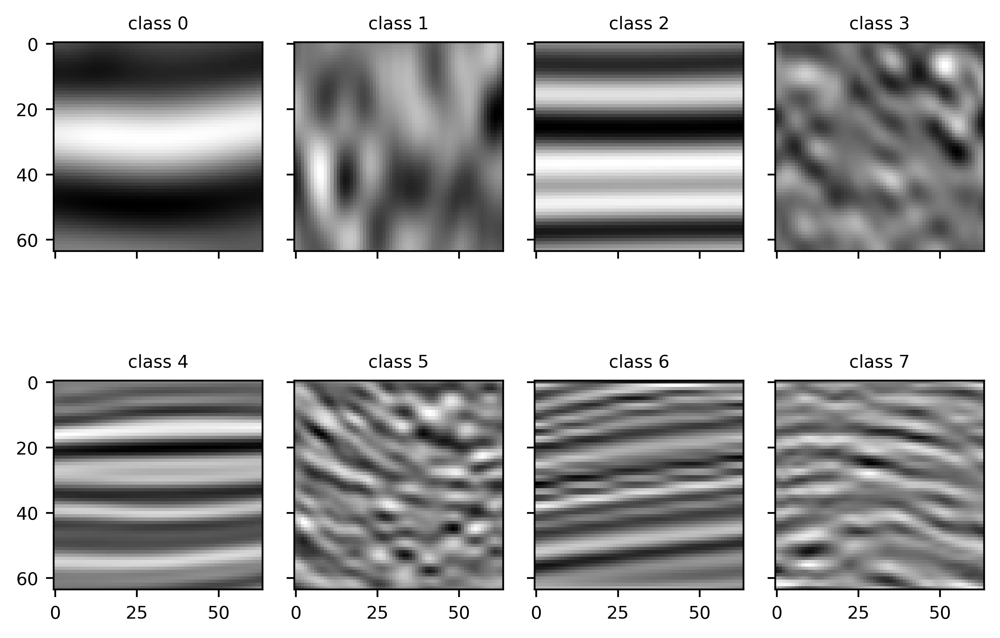

In [5]:
import os
import itertools
import json
import numpy as np
import tensorflow as tf
import tensorflow_addons as tfa
import matplotlib.pyplot as plt
from scipy import ndimage
from tqdm import tqdm
import elasticdeform
import bruges
import bruges as bg


# Hyperparameters
SNR_RANGE = (25, 100)
start_density = 0.0005
stop_density = 16 * start_density
dts = np.round(np.geomspace(start_density, stop_density, 4), 4)
patch_size = [64, 64, 64]

params = {
    "widths": dts,
    "periods": [(1, 2), (patch_size[1] / 8, patch_size[1] / 4)]
}
params_out = params
params_out["snr_range"] = SNR_RANGE

classes = list(itertools.product(params["widths"], params["periods"]))
labels = np.arange(len(classes))

# TensorFlow function to standard scale data
@tf.function
def tf_standard_scaler(X):
    mean, var = tf.nn.moments(X, axes=[1, 2, 3], keepdims=True)
    return (X - mean) / tf.sqrt(var)

# Function to generate Ormsby filter range
def ormsby_range(center=(2, 5, 100, 120), widths=(2, 3, 3, 2)):
    centers = np.array([[5, 10, 65, 70]])
    shift = np.random.randint(0, 3)
    center = centers[np.random.randint(len(centers))]
    center += shift
    f0, f1, f2, f3 = center
    return [f0, f1, f2, f3]

# Function to draw a parameter value
def draw_parameter(param):
    return np.random.uniform(*param) if isinstance(param, tuple) else param

# Function to generate a 2D view
def generate_2D_view(dimt, dimx, n_traces):
    reflections = [np.roll(np.random.uniform(-1, 1, dimt), shift=np.random.randint(-dimt, dimt)) for _ in range(n_traces)]
    if len(reflections) == 1:
        reflections.append(reflections[0])
    interp = panel(*reflections, num=dimx)
    return interp

# Function to interpolate subcubes
def subcube_interpolation(dimt, dimx, n_traces, delta):
    A = generate_2D_view(dimt, dimx, n_traces)
    B = generate_2D_view(dimt, dimx, n_traces)
    B = ndimage.shift(B, axis=(np.random.randint(-dimt, dimt), 0), shift=np.random.randint(dimt), mode='wrap')
    output = np.linspace(A, B, delta)
    return np.transpose(output, (1, 2, 0))

# Function to generate a 3D cube with normal distribution
def generate_3D_cube_normal(dimt, dimx, n_traces, n_slices=1):
    output = np.zeros((dimt, dimx, dimx))
    current = generate_2D_view(dimt, dimx, n_traces)
    if n_slices > 1:
        inds = np.arange(0, dimx, dimx // n_slices)
        inds[-1] = dimx - 1
        for i in range(len(inds) - 1):
            new = generate_2D_view(dimt, dimx, n_traces)
            temp = np.linspace(current, new, inds[i + 1] - inds[i])
            output[:, :, inds[i]:inds[i + 1]] = np.transpose(temp, (1, 2, 0))
            current = new
    else:
        temp = np.linspace(current, current, dimx)
        output = np.transpose(temp, (1, 2, 0))
    return output

# Function to generate random reflectivity
def random_reflectivity_2(cube, label):
    dimt, dimx = cube.shape[:2]
    width, periods = classes[label]
    cont1, cont2 = np.random.uniform(*periods, size=2)
    return generate_3D_cube_normal(dimt, dimx, int(cont1), int(cont2))

# TensorFlow wrapper for random reflectivity
@tf.function
def tf_random_reflectivity_2(cube, label):
    shape = cube.shape
    cube = tf.py_function(random_reflectivity_2, [cube, label], [tf.float32])[0]
    cube.set_shape(shape)
    return cube, label

# Function to apply folding transformation
def fold2(cube, label, dip=(-5, 5)):
    deform_amplitude = np.random.normal(cube.shape[0] / 32, 1)
    cube = elasticdeform.deform_random_grid(cube, sigma=deform_amplitude, points=3, axis=(0, 1), mode='wrap', order=2)
    deform_amplitude = np.random.normal(cube.shape[0] / 32, 1)
    cube = elasticdeform.deform_random_grid(cube, sigma=deform_amplitude, points=3, axis=(0, 2), mode='wrap', order=2)
    cube = ndimage.rotate(cube, np.random.uniform(*dip), axes=(0, 2), reshape=False, order=2)
    cube = ndimage.rotate(cube, np.random.uniform(*dip), axes=(0, 1), reshape=False, order=2)
    crop = [slice(cube.shape[i] // 4, -cube.shape[i] // 4) for i in range(3)]
    cropped_cube = cube[crop[0], crop[1], crop[2]]
    zoom_factors = [cube.shape[i] / cropped_cube.shape[i] for i in range(3)]
    return ndimage.zoom(cropped_cube, zoom_factors, order=2)

# TensorFlow wrapper for folding transformation
@tf.function
def tf_fold2(cube, label, dip):
    shape = cube.shape
    cube = tf.py_function(fold2, [cube, label, dip], [tf.float32])[0]
    cube.set_shape(shape)
    return cube, label

# Function to add random noise
def random_noise(cube):
    return cube + bruges.noise.noise.noise_db(cube, np.random.uniform(*SNR_RANGE))

# TensorFlow wrapper for random noise
@tf.function
def tf_random_noise(cube, label):
    shape = cube.shape
    cube = tf.py_function(random_noise, [cube], [tf.float32])[0]
    cube.set_shape(shape)
    return cube, label

# Function to convolve with random filter
def random_convolve(cube, label):
    sr, _ = classes[label]
    duration = sr * cube.shape[0]
    f = ormsby_range()
    w, _ = bg.filters.ormsby_fft(duration=duration, dt=sr, f=f)
    return bruges.filters.convolve(cube, w[:cube.shape[0]], axis=0)

# TensorFlow wrapper for random convolution
@tf.function
def tf_random_convolve(cube, label):
    shape = cube.shape
    cube = tf.py_function(random_convolve, [cube, label], [tf.float32])[0]
    cube.set_shape(shape)
    return cube, label

# Function to generate data using a pipeline
def numpy_generation_pipeline(cubes, labels, dip, padding=False):
    output = np.zeros(cubes.shape, dtype=np.single)
    for i in tqdm(range(len(labels))):
        cube = cubes[i, ..., 0]
        cube = random_reflectivity_2(cube, labels[i])
        if not padding:
            cube = fold2(cube, labels[i], dip=dip)
        cube = random_convolve(cube, labels[i])
        output[i, ..., 0] = cube
    return output, labels

# Function to randomly flip the data
def random_flip(x, y):
    cond = tf.random.categorical(tf.math.log([[i / sum(range(1, 5)) for i in range(1, 5)]]), 1)[0][0]
    if cond == 1:
        x = tf.reverse(x, axis=[1])
    elif cond == 2:
        x = tf.reverse(x, axis=[2])
        x = tf.reverse(x, axis=[1])
    elif cond == 3:
        x = tf.reverse(x, axis=[2])
    return x, y

# Function to add noise to the data
def add_noise_test(data):
    snr = tf.random.uniform(shape=(), minval=SNR_RANGE[0], maxval=SNR_RANGE[1])
    sig_power = tf.reduce_mean(tf.square(data))
    sig_power_db = 10 * tf.math.log(sig_power) / tf.math.log(10.0)
    noise_power_db = sig_power_db - snr
    noise_power = tf.pow(10.0, noise_power_db / 10)
    noise = tf.random.normal(shape=tf.shape(data), mean=0., stddev=tf.sqrt(noise_power))
    return data + noise

# Function to normalize values
def normalize_values(data):
    orig_shape = data.shape
    data = tf.reshape(data, shape=(data.shape[0], -1))
    min_val = tf.reduce_min(data, axis=1, keepdims=True)
    max_val = tf.reduce_max(data, axis=1, keepdims=True)
    normalized_data = (data - min_val) / (max_val - min_val) * 2.0 - 1.0
    return tf.reshape(normalized_data, orig_shape)

# Example of usage
from_each = 1
bs = from_each * len(classes)
temp = np.zeros((bs, *patch_size, 1), dtype=np.single)
labels_temp = np.arange(len(classes)).repeat(from_each)

numpy_ds, numpy_labels = numpy_generation_pipeline(temp, labels_temp, dip=(-10, 10), padding=False)
numpy_ds = add_noise_test(numpy_ds)
numpy_ds = tf_standard_scaler(numpy_ds)

fig, axs = plt.subplots(2, len(classes) // 2, dpi=500, sharey=True, sharex=True)
for ind, ax in enumerate(axs.flat):
    ax.imshow(numpy_ds[ind, :, 0, :, 0], cmap='gray')
    ax.set_title(f'class {numpy_labels[ind]}', fontsize=8)
    ax.tick_params(axis='both', labelsize=8)

plt.tight_layout()
plt.show()


In [6]:
import tensorflow as tf
import tensorflow_addons as tfa
import numpy as np

# Regularization loss for L2 norm
def l2norm(embeddings_a, embeddings_p, reg_lambda=0.0):
    """Regularize output of embeddings"""
    reg_anchor = tf.reduce_mean(tf.reduce_sum(tf.square(embeddings_a), axis=1))
    reg_positive = tf.reduce_mean(tf.reduce_sum(tf.square(embeddings_p), axis=1))
    l2_loss = reg_lambda * (reg_anchor + reg_positive)
    return l2_loss

@tf.function
def loss_fn(embeddings_a, embeddings_p, labels):
    """Loss function using npairs loss"""
    d_matrix = tf.matmul(embeddings_a, embeddings_p, transpose_b=True)
    return tfa.losses.npairs_loss(labels, d_matrix)

@tf.function
def loss_fn_mc(embeddings_a, embeddings_p, labels):
    """Loss function for multi-class npairs loss"""
    d_matrix = tf.matmul(embeddings_a, embeddings_p, transpose_b=True)
    return tfa.losses.npairs_multilabel_loss(labels, d_matrix)

@tf.function
def train_step_npair(model, optimizer, tensor_a, tensor_p, labels):
    """Training step for npairs loss"""
    with tf.GradientTape() as tape:
        embeddings_a = model(tensor_a, training=True)
        embeddings_b = model(tensor_p, training=True)
        labels_new = tf.range(tf.shape(embeddings_a)[0])
        loss = loss_fn(embeddings_a, embeddings_b, labels_new)

        gradients = tape.gradient(loss, model.trainable_weights)
        optimizer.apply_gradients(zip(gradients, model.trainable_weights))

    return loss

@tf.function
def train_step_npair_mc_reg(model, optimizer, tensor_a, tensor_p, labels, reg_lambda=0.0):
    """Training step for multi-class npairs loss with regularization"""
    labels_new = tf.range(tf.shape(tensor_a)[0])
    labels_new = tf.one_hot(labels_new, tf.shape(tensor_a)[0])

    with tf.GradientTape() as tape:
        embeddings_a = model(tensor_a, training=True)
        embeddings_b = model(tensor_p, training=True)
        loss = loss_fn_mc(embeddings_a, embeddings_b, labels_new)

    gradients = tape.gradient(loss, model.trainable_weights)
    optimizer.apply_gradients(zip(gradients, model.trainable_weights))

    return loss + l2norm(embeddings_a, embeddings_b, reg_lambda)

@tf.function
def flip_utils(x, p):
    """Utility function to flip the input tensor along the third axis"""
    return tf.reverse(x, axis=[2])

@tf.function
def flip_augmentation(x, y, p=0.5):
    """Apply flip augmentation"""
    x = flip_utils(x, p)
    return x, y

@tf.function
def tf_standard_scaler_train(X, y):
    """Standard scaler for training data"""
    mean, var = tf.nn.moments(X, axes=[1, 2, 3], keepdims=True)
    return (X - mean) / tf.sqrt(var), y

def random_noise(cube):
    """Add random noise to the input"""
    return cube + bruges.noise.noise.noise_db(cube, np.random.uniform(*SNR_RANGE))

@tf.function
def tf_random_noise_train(cube1, cube2, label):
    """Apply random noise to training data"""
    shape = cube1.shape
    [cube1] = tf.py_function(random_noise, [cube1], [tf.float32])
    [cube2] = tf.py_function(random_noise, [cube2], [tf.float32])
    cube1.set_shape(shape)
    cube2.set_shape(shape)

    return cube1, cube2, label

@tf.function
def add_noise(data, label):
    """Add noise to data based on a random SNR value"""
    snr = tf.random.uniform((), minval=SNR_RANGE[0], maxval=SNR_RANGE[1])
    sig_power = tf.reduce_mean(tf.square(data))
    sig_power_db = 10 * tf.math.log(sig_power) / tf.math.log(10.0)
    noise_power_db = sig_power_db - snr
    noise_power = tf.pow(10.0, noise_power_db / 10)
    noise = tf.random.normal(tf.shape(data), mean=0., stddev=tf.sqrt(noise_power))
    data_noisy = data + noise

    return data_noisy, label


In [7]:
import gdown
import tensorflow as tf

# Download the model from Google Drive
file_id = '1vawg4weJcqjoreMji9DUvKljdKPcKPkP'#'1vawg4weJcqjoreMji9DUvKljdKPcKPkP'
url = f'https://drive.google.com/uc?id={file_id}'
output_file = 'downloaded_model.h5'

# Download the model file
gdown.download(url, output_file, quiet=False)


Downloading...
From: https://drive.google.com/uc?id=1vawg4weJcqjoreMji9DUvKljdKPcKPkP
To: /content/downloaded_model.h5
100%|██████████| 10.1M/10.1M [00:00<00:00, 13.2MB/s]


'downloaded_model.h5'

In [8]:
import json
# Hyperparameters and configurations
num_epochs = 20
batch_size = 128
NUM_BATCHES = 128
initial_filters = 8
embedding_dimension = 128
use_l2_regularization = True
dip_range = (-15, 15)
learning_rate = 1e-3
regularization_lambda = 0.004
weight_decay = 0.0

# Validate that regularization lambda is a float
assert isinstance(regularization_lambda, float), "reg_lambda must be a float."

# Learning rate scheduler
lr_scheduler = tf.keras.optimizers.schedules.CosineDecay(
    initial_learning_rate=learning_rate, decay_steps=num_epochs, alpha=0.5
)

# Optimizer setup
optimizer = tfa.optimizers.AdamW(learning_rate=lr_scheduler, weight_decay=weight_decay)

# Generate model classes based on parameters
widths = [16, 32, 64]  # Example widths, replace with actual values
periods = [2, 4, 8]    # Example periods, replace with actual values
classes = list(itertools.product(widths, periods))

# Model naming
input_model_name = output_file
output_model_name_suffix = "_modified"
output_model_name = f"{input_model_name}{output_model_name_suffix}"

# Directory setup for model checkpoints
checkpoint_dir = "./checkpoints"
output_dir = os.path.join(checkpoint_dir, output_model_name)
os.makedirs(output_dir, exist_ok=True)

# Parameter output setup
params_out = {
    "dip_range": dip_range,
    "reg_lambda": regularization_lambda,
    "num_epochs": num_epochs,
    "widths": widths,
    "periods": periods
}

output_params_path = os.path.join(output_dir, "params_out.json")
with open(output_params_path, 'w') as f:
    json.dump(params_out, f)

# Load and compile the model
model = tf.keras.models.load_model(output_file)
model.compile(optimizer=optimizer)
model.summary()

# Save the new model to avoid overwriting
new_model_path = os.path.join(output_dir, "modified_model.h5")
model.save(new_model_path)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, None, None, None,    0         []                            
                             1)]                                                                  
                                                                                                  
 conv3d_25 (Conv3D)          (None, None, None, None, 3   864       ['input_2[0][0]']             
                             2)                                                                   
                                                                                                  
 batch_normalization_14 (Ba  (None, None, None, None, 3   128       ['conv3d_25[0][0]']           
 tchNormalization)           2)                                                             

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:


def generator_fn(patch_size, classes, dip):
    # for _ in range(NUM_BATCHES):
    labels = list(np.arange(len(classes))) + list(np.arange(len(classes)))
    # Initialize output with the correct shape
    output = np.zeros((len(labels), *patch_size, 1), dtype=np.single)

    for i in range(len(labels)):
        cube = random_reflectivity_2(np.zeros(patch_size,dtype=np.single),labels[i])
        cube = fold2(cube,labels[i],dip=dip)
        # Assign the generated cube to the corresponding index in output
        output[i, ...] = random_convolve(cube,labels[i])[..., None]

    # Yield the output and all labels
    yield output, np.array(labels)


classes = list(itertools.product(params["widths"],params["periods"]))
PATCH_SIZE = patch_size

# Update output_signature to match the actual output shape
output_signature = (tf.TensorSpec(shape=(2*len(classes), *PATCH_SIZE, 1), dtype=tf.float32),
                    tf.TensorSpec(shape=(2*len(classes)), dtype=tf.int32))  # Label is a scalar

# Create a dataset from the generator function
ds = tf.data.Dataset.from_generator(
    lambda: generator_fn(PATCH_SIZE, classes, dip_range),
    output_signature=output_signature
) # Batch the dataset to match NUM_BATCHES


for data, label in ds:

  print(data.shape)
  print(label.shape)

(16, 64, 64, 64, 1)
(16,)


In [ ]:


# Function to rotate a single volume
def rotate_volume(volume, axes=(1, 2)):
    # Randomly choose a rotation angle
    angle = np.random.choice([90, 180, 270, 360])
    # Skip the rotation if the angle is 360 since it's a full circle
    if angle == 360:
        return volume
    # Rotate the volume. The reshape is needed because scipy.ndimage.rotate expects a full 3D array.
    volume_rotated = rotate(volume.reshape(*volume.shape[:-1]), angle, axes=axes, reshape=False)
    # After rotation, put back into the original shape [64, 64, 64, 1]
    return volume_rotated.reshape(volume.shape)


In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tqdm import tqdm
import time

# Define global variables
PATCH_SIZE = [64, 64, 64]



# Initialize training parameters
num_epochs = 20
best_loss = np.inf
history = []



output_dir = f"./saved_models/modified_model"
os.makedirs(output_dir, exist_ok=True)

output_signature = (tf.TensorSpec(shape=(2*len(classes), *PATCH_SIZE, 1), dtype=tf.float32),
                    tf.TensorSpec(shape=(2*len(classes)), dtype=tf.int32))  # Label is a scalar

# Create a dataset from the generator function
ds = tf.data.Dataset.from_generator(
    lambda: generator_fn(PATCH_SIZE, classes, dip_range),
    output_signature=output_signature
)



# Training loop
for epoch in range(num_epochs):
    start_time = time.time()
    total_loss = 0


    for _ in tqdm(range(NUM_BATCHES), desc="Training"):
      for x_batch, y_batch in ds.map(tf_standard_scaler_train):#tqdm(, desc="Training"):

          # Add noise to the batch
          x_batch, y_batch = add_noise(x_batch, y_batch)

          # Rotate volumes (example transformation, replace with actual transformation if needed)
          rotated_volumes = [rotate_volume(vol.numpy()) for vol in x_batch]
          rotated_volumes = tf.convert_to_tensor(rotated_volumes)
          x_batch_reshape = tf.reshape(rotated_volumes, (2, len(classes), *PATCH_SIZE, 1))
          y_batch_reshape = tf.reshape(y_batch, (2, len(classes)))

          # Split into anchor and positive examples
          anchor = x_batch_reshape[0]
          positive = x_batch_reshape[1]
          label = y_batch[0]

          # Training step
          loss = train_step_npair_mc_reg(model, optimizer, anchor, positive, label, regularization_lambda)
          total_loss += loss

    # Calculate average loss for the epoch
    total_loss = total_loss.numpy() / NUM_BATCHES
    history.append(total_loss)

    # Log training loss
    dict_history = {"epoch": np.arange(len(history)), "loss": history}
    df = pd.DataFrame(dict_history)
    df.to_csv(os.path.join(output_dir, "training_loss_logger.csv"), index=False)

    # Save the best model
    if total_loss < best_loss:
        print(f"Finished epoch {epoch} --- loss improved from {best_loss:.6} to {total_loss:.6}")
        best_loss = total_loss
        model.save(os.path.join(output_dir, "seis_seg_best.h5"))
    else:
        model.save(os.path.join(output_dir, "seis_seg.h5"))
        print(f"Finished epoch {epoch} with loss {total_loss:.6} --- loss did not improve from {best_loss:.6}")

    end_time = time.time()
    print(f"Epoch {epoch} completed in {end_time - start_time:.2f} seconds.")


Training: 100%|██████████| 128/128 [17:14<00:00,  8.08s/it]
/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Finished epoch 0 --- loss improved from inf to 0.970082
Epoch 0 completed in 1035.37 seconds.


Training: 100%|██████████| 128/128 [17:25<00:00,  8.17s/it]


Finished epoch 1 --- loss improved from 0.970082 to 0.650471
Epoch 1 completed in 1045.69 seconds.


Training: 100%|██████████| 128/128 [17:50<00:00,  8.36s/it]


Finished epoch 2 --- loss improved from 0.650471 to 0.459504
Epoch 2 completed in 1070.57 seconds.


Training: 100%|██████████| 128/128 [17:50<00:00,  8.36s/it]


Finished epoch 3 --- loss improved from 0.459504 to 0.391962
Epoch 3 completed in 1070.95 seconds.


Training: 100%|██████████| 128/128 [17:51<00:00,  8.37s/it]


Finished epoch 4 --- loss improved from 0.391962 to 0.348714
Epoch 4 completed in 1072.14 seconds.


Training: 100%|██████████| 128/128 [17:24<00:00,  8.16s/it]


Finished epoch 5 --- loss improved from 0.348714 to 0.303086
Epoch 5 completed in 1044.65 seconds.


Training: 100%|██████████| 128/128 [17:50<00:00,  8.36s/it]


Finished epoch 6 with loss 0.329252 --- loss did not improve from 0.303086
Epoch 6 completed in 1070.55 seconds.


Training:  93%|█████████▎| 119/128 [16:12<01:12,  8.08s/it]

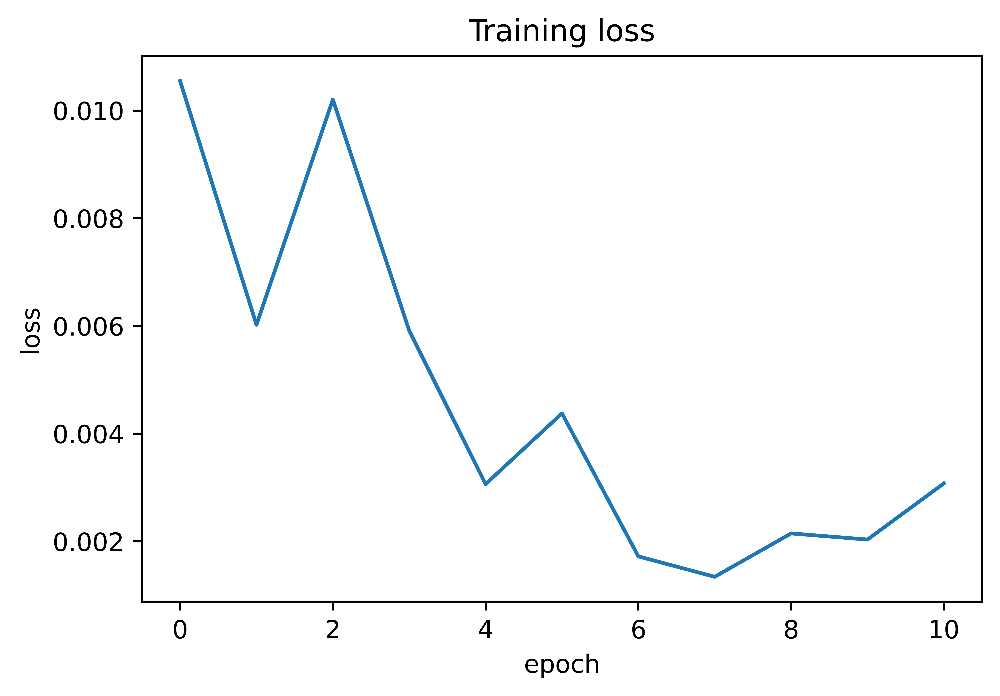

In [ ]:
import pandas as pd
fp = f'./pnet_synth/{out_model}/training_loss_logger.csv'
df = pd.read_csv(fp)

fig,ax = plt.subplots(1,1,dpi=1000)
ax.plot(df["epoch"][:100],df["loss"][:100])
ax.set_title('Training loss')
ax.set_xlabel("epoch")
ax.set_ylabel("loss")

plt.show()

In [ ]:
from_each = 8
bs = from_each * len(classes)
temp = np.zeros((bs,*patch_size,1),dtype=np.single)
labels_temp = np.arange(len(classes)).repeat(from_each)




numpy_ds, numpy_labels = numpy_generation_pipeline(temp,labels_temp,dip=(-10,10),padding=False)
numpy_ds = add_noise_test(numpy_ds)
numpy_ds = tf_standard_scaler(numpy_ds)
print(numpy_ds.shape)




100%|██████████| 64/64 [00:09<00:00,  6.97it/s]


(64, 64, 64, 64, 1)


model_npair_loss_(128, 128, 128)4000


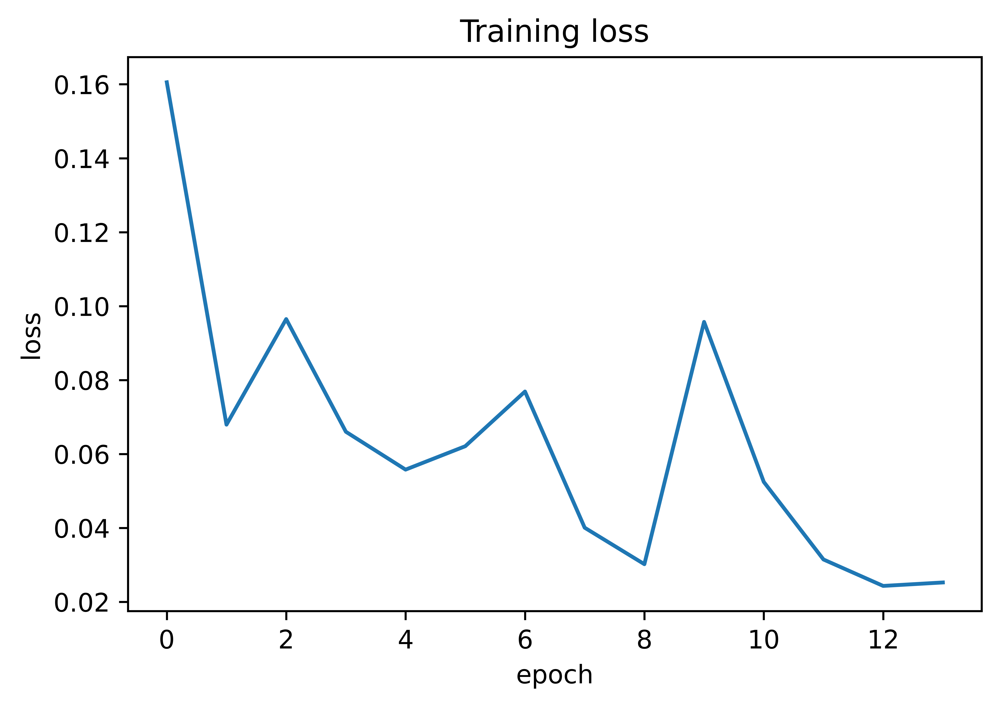

In [ ]:
#path = 'model_npair_loss_(128, 128, 128)_LITE41'
path = 'model_npair_loss_(128, 128, 128)4000'
print(path)
m_path = 'seis_seg_best.h5'


model = tf.keras.models.load_model(f"./pnet_synth/{path}/{m_path}")#,custom_objects={'DepthwiseConv3D': DepthwiseConv3D})
new_model = tf.keras.models.clone_model(model)
new_model.compile(optimizer=optimizer) #initialize model with random weights (undtrained)

features_synth_trained = model.predict(numpy_ds)
features_synth_untrained = new_model.predict(numpy_ds)


fp = f'./pnet_synth/{path}/training_loss_logger.csv'
df = pd.read_csv(fp)

fig,ax = plt.subplots(1,1,dpi=1000)
ax.plot(df["epoch"][:100],df["loss"][:100])
ax.set_title('Training loss')
ax.set_xlabel("epoch")
ax.set_ylabel("loss")

plt.show()

In [ ]:



def within_cluster_variance(features, labels):
    within_cluster_var = 0
    for label in np.unique(labels):
        cluster = features[labels == label]
        centroid = np.mean(cluster, axis=0)
        variance = np.sum((cluster - centroid) ** 2)
        within_cluster_var += variance
    return within_cluster_var


def between_cluster_variance(features,labels):
    overall_mean = np.mean(features, axis=0)

    between_cluster_var = 0
    for label in np.unique(labels):
        cluster = features[labels == label]
        cluster_centroid = np.mean(cluster, axis=0)

        squared_distance = np.sum((cluster_centroid - overall_mean) ** 2)


        between_cluster_var +=  squared_distance
    return between_cluster_var



untrained model
WCSS for untrained model: 0.6111626987125448
BCS for untrained model: 0.04860467545252961
(64, 32, 32, 1)


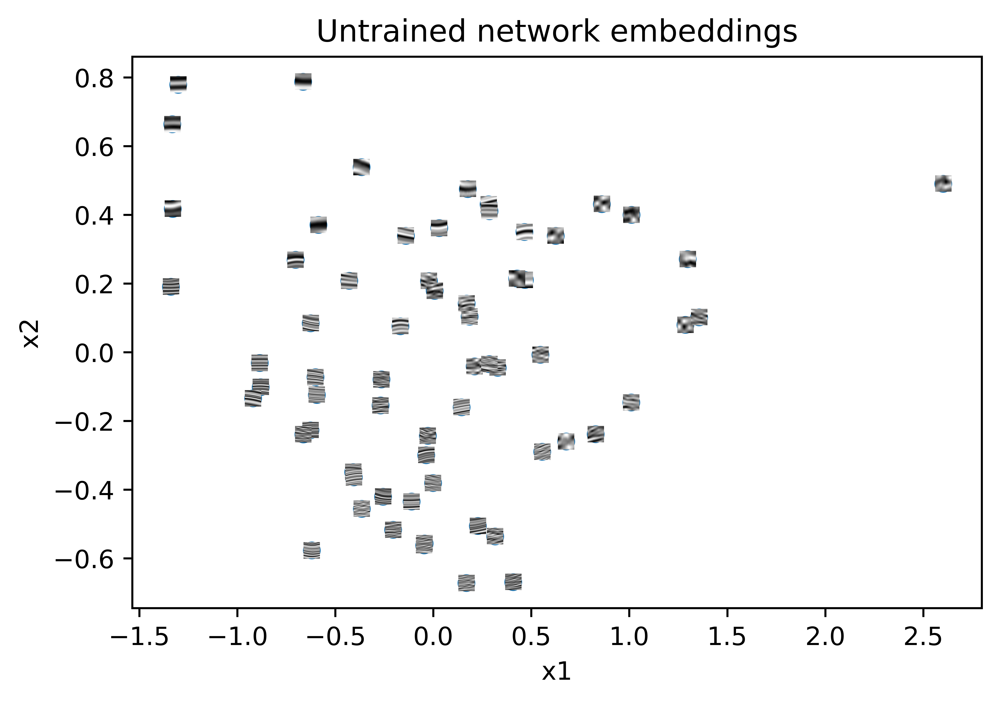

trained model
WCSS for trained model: 0.30814303811600785
BCS for trained model: 0.08648212547498171
(64, 32, 32, 1)


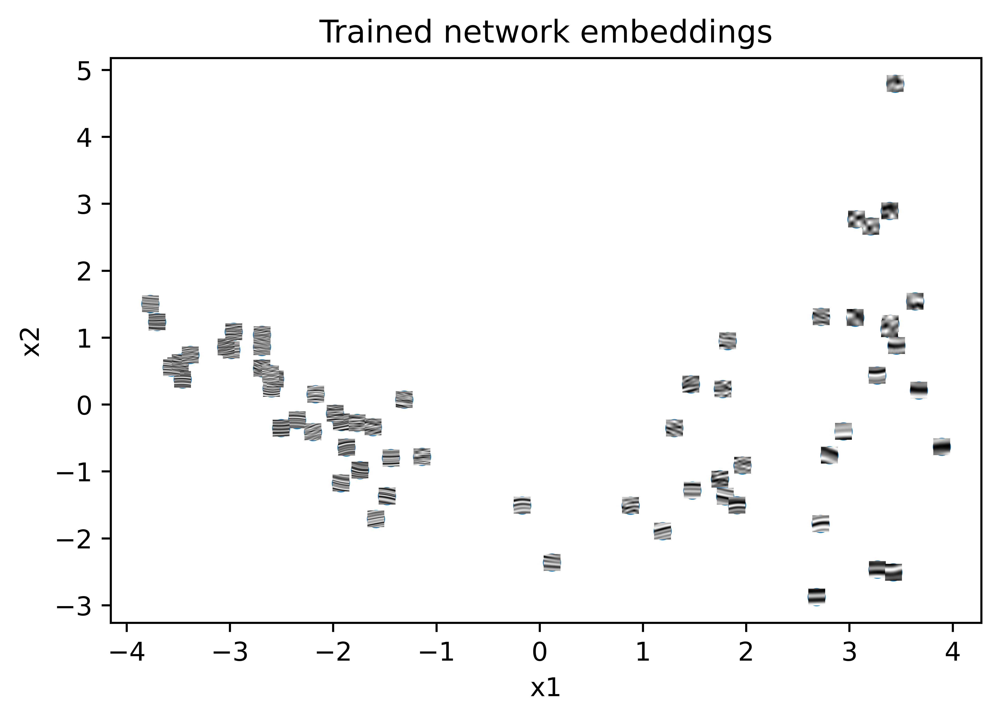

In [ ]:
synthetic_feature_dict = {"untrained model" : features_synth_untrained,
                          "trained model" : features_synth_trained}

imagelist=[]
for cube in numpy_ds:
    temp = cube[::2,cube.shape[1]//2,::2]
    imagelist.append(temp)
imagelist = np.array(imagelist)


step = 1

for key,values in synthetic_feature_dict.items():
    print(key)
    tss = np.sum((values - np.mean(values, axis=0)) ** 2)

    wcss = within_cluster_variance(values,labels_temp)/tss
    bcs = between_cluster_variance(values,labels_temp)/tss

    print(f"WCSS for {key}: {wcss}")
    print(f"BCS for {key}: {bcs}")
    embeddings = PCA(n_components=2).fit_transform(values.reshape(-1,values.shape[-1]))
    print(imagelist.shape)


    x = embeddings[::step,0]
    y = embeddings[::step,1]
    ims = imagelist[::step,:,:]



    plt.figure(dpi=800)
    plt.title(f'PCA-embeddings for {key}')
    plt.scatter(x, y)

    # Customize the appearance of the plot, add labels, titles, etc.
    plt.xlabel('x1')
    plt.ylabel('x2')


    # Add the images to the scatter plot
    for i in range(len(x)):
        image = ims[i]  # Load the image from the file
        imgbox = OffsetImage(image, zoom=0.2, cmap='gray')  # Adjust zoom factor as needed
        ab = AnnotationBbox(imgbox, (x[i], y[i]), frameon=False, pad=0)
        plt.gca().add_artist(ab)

    if key == 'untrained model':
        plt.title('Untrained network embeddings')
        plt.savefig(f"./paperfigures/pca_embedded_untrained_{path.split('_',)[-1]}.png")
    if key == 'trained model':
        plt.title('Trained network embeddings')
        plt.savefig(f"./paperfigures/pca_embedded_trained_{path.split('_',)[-1]}.png")

    plt.show()

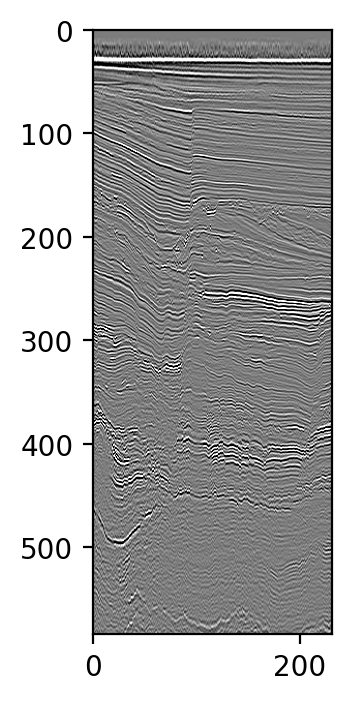

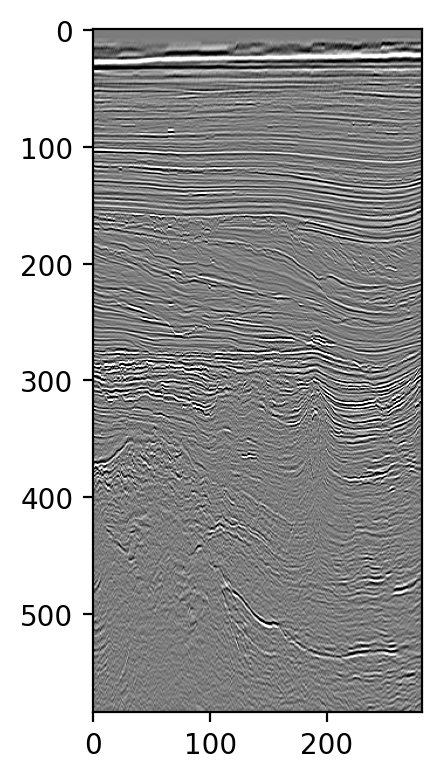

In [ ]:
from skimage.transform import resize
import scipy




#DS = "POSEIDON"
#DS = "TOPSEIS"
DS = "PARIHAKA"
#DS = "HORDA"
#DS = "F3"
#DS = "NORDKAPP"

"""F3"""
if DS == "F3":
    dat = np.load("/datasets/f3_full_dip_steer/F3_dip_steer_full.npy")
    dat = dat.astype(np.single)
    dat = dat[:,:600,:]

"""TOPSEIS"""
if DS == 'TOPSEIS':
    dat = np.load("/datasets/topseis/topseis.npy")
    dat = dat[100:,]

"""HORDA"""
if DS == 'HORDA':
    dat = np.load("/datasets/horda/horda.npy")


if DS == "NORDKAPP":
    dat = np.load("/datasets/nordkapp/nordkapp_basin.npy")
    dat = dat[40:,:-20,:]

"""POSEIDON"""
if DS == 'POSEIDON':
    dat = np.load("/datasets/poseidon_crop/poseidon_crop.npy").T
    dat = dat[:900,:,:200]
    dat = np.transpose(dat[:900,:,:200],(0,2,1))

if DS ==  "PARIHAKA":
    dat = np.load("/datasets/parihaka/parihaka3D.npy").T

down_samp = (2,4,4)
dat_crop = dat[::down_samp[0],::down_samp[1],::down_samp[2]]

dat_crop = (dat_crop - dat_crop.mean()) / dat_crop.std()
EXP = False
if EXP:
    dat_crop = exposure.equalize_hist(dat_crop)


dpi = 200
l,h = np.percentile(dat_crop,(2,98))

fig,ax = plt.subplots(1,1,dpi=dpi,sharey=True)
ax.imshow(dat_crop[:,0,:],cmap="gray",vmin=l,vmax=h)
plt.show()

fig,ax = plt.subplots(1,1,dpi=dpi,sharey=True)
ax.imshow(dat_crop[:,:,10],cmap="gray",vmin=l,vmax=h)

plt.tight_layout()
plt.show()


In [ ]:

@tf.function
def tf_standard_scaler(X):
    mean,var = tf.nn.moments(X, axes = [1,2,3], keepdims=True)
    return (X - mean) / tf.sqrt(var)


class DataGenerator(tf.keras.utils.Sequence):
    'Generates data for Keras'
    def __init__(self, data, strides, batch_size=32, dim=(32,32,32), n_channels=1,padding=True,mask=None):
        'Initialization'
        self.data = data
        self.padding=padding
        self.mean = data.mean()
        self.std = data.std()
        self.dim = dim
        self.hs = [d//2 for d in self.dim]
        if padding: self.data = seismic_padding(self.data,self.hs)


        self.mask = mask
        if type(self.mask) != type(None): self.mask = seismic_padding(self.mask,self.hs)

        self.batch_size = batch_size
        self.strides = strides



        self.inds = np.array(list(itertools.product(
                                      np.arange(self.hs[0],self.data.shape[0]-self.hs[0],self.strides[0]),
                                      np.arange(self.hs[1],self.data.shape[1]-self.hs[1],self.strides[1]),
                                      np.arange(self.hs[2],self.data.shape[2]-self.hs[2],self.strides[2])
                                      )))

        self.indexes = np.arange(len(self.inds))
        self.n_channels = n_channels


        self.output_shape = self.data[
                            self.hs[0]:-self.hs[0]:self.strides[0],
                            self.hs[1]:-self.hs[1]:self.strides[1],
                            self.hs[2]:-self.hs[2]:self.strides[2]].shape



    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.inds) / self.batch_size))

    def __get_volume(self,index):
        i,j,k = index
        wi,wj,wk = self.hs
        temp = self.data[i-wi:i+wi,j-wj:j+wj,k-wk:k+wk]
        #p2,p98 = np.percentile(temp, (5,95))
        #temp = exposure.rescale_intensity(temp,in_range=(p2,p98))

        #temp = (temp - temp.mean()) / temp.std()
        return temp[...,np.newaxis]


    def __data_generation(self, center_inds_temp):
        X = np.empty((self.batch_size, *self.dim, self.n_channels))
        for i, ID in enumerate(center_inds_temp):
            X[i,] = self.__get_volume(ID)

        return X.astype(np.single)


    def __getitem__(self, index):
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]
        # Find list of IDs
        center_inds_temp = [self.inds[k] for k in indexes]

        # Generate data
        X = self.__data_generation(center_inds_temp)

        return tf.convert_to_tensor(X,dtype=tf.float32)





In [ ]:



UNTRAINED = False
KNN_feats = False
STD = False

BATCH_SIZE = 128
PATCH_SIZE = (32,32,32)#(64,64,64)#(128,128,128)#
STRIDES = (4,4,4)#(16,16,16)

if path:
    PATCH_SIZE = PATCH_SIZE#(32,32,32)#(64,64,64)#(128,128,128)#




model = tf.keras.models.load_model(f"./pnet_synth/{path}//{m_path}")


if KNN_feats:
    STRIDES = tuple([i//2 for i in PATCH_SIZE])
    new_model = tf.keras.models.clone_model(model)
    new_model.compile(optimizer=optimizer)

    # Reinitialize weights using custom initializer
    for layer in new_model.layers:
        if hasattr(layer, 'kernel_initializer'):
            initializer = layer.kernel_initializer
            new_weights = initializer(shape=layer.kernel.shape)
            layer.set_weights([new_weights] + layer.get_weights()[1:])




datagen = DataGenerator(dat_crop,
                    strides=STRIDES,
                    batch_size=BATCH_SIZE,
                    dim=PATCH_SIZE,
                    n_channels=1,
                    padding=False)


if out_model.split("_")[-1] == "ft":
    temp_str = "".join(out_model.split("_")[-2:])
    foutput  = f'features_{DS}_{STRIDES}_PS_{PATCH_SIZE}_{temp_str}'
else:
    foutput  = f'features_{DS}_{STRIDES}_PS_{PATCH_SIZE}_{path.split("_")[-1]}'



if KNN_feats:
    foutput = foutput + "_KNN"


if STD:
    foutput = foutput + "_STD"

if EXP:
    foutput = foutput + "_EXP"

if UNTRAINED:
    foutput = foutput + "_UNTRAINED"



foutput  += "_LITE"
foutput   += ".npy"



print(f'output feature map : {foutput}')
print(f"num samples {len(datagen.inds)}")


output feature map : features_PARIHAKA_(4, 4, 4)_PS_(32, 32, 32)_(128, 128, 128)4000_LITE.npy
num samples 434700


In [ ]:
import time
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
  tf.config.experimental.set_memory_growth(gpu, True)


def make_gen_callable(_gen):
    def gen():
        for x in _gen:
             yield x
    return gen



def get_cube_generator(data,inds,pred_sizes):
        for i,j,k in inds:
            wi,wj,wk = pred_sizes

            temp = data[None,i-wi//2:i+wi//2,j-wj//2:j+wj//2,k-wk//2:k+wk//2,None]

            yield temp[0,...]


model_dict = {}

if KNN_feats:
    model_dict = {"trained" : [],
                  "untrained" : [] }
else:
    model_dict = {"trained" : []}

for i in range(len(model_dict.keys())):

    gene = make_gen_callable(get_cube_generator(datagen.data,datagen.inds,tuple(PATCH_SIZE)))
    predict_ds = tf.data.Dataset.from_generator(gene,
                                       output_signature=(
                                       tf.TensorSpec(shape=(*PATCH_SIZE,1), dtype=tf.float32)
                                    ))




    if STD:
        predict_ds = predict_ds.map(tf_standard_scaler).batch(BATCH_SIZE,num_parallel_calls=AUTOTUNE)

    else:
        predict_ds = predict_ds.batch(BATCH_SIZE,num_parallel_calls=AUTOTUNE)





    if list(model_dict.keys())[i] == 'trained':
        sr = time.time()
        model_dict[list(model_dict.keys())[i]] = model.predict(predict_ds)
        st = time.time()
        print(f"prediction time {list(model_dict.keys())[i]} { (st-sr) / 60 } minutes")

    if list(model_dict.keys())[i] == 'untrained':

        sr = time.time()
        model_dict[list(model_dict.keys())[i]] = new_model.predict(predict_ds)
        st = time.time()
        print(f"prediction time {list(model_dict.keys())[i]} { (st-sr) / 60 } minutes")


    np.save(foutput,model_dict[list(model_dict.keys())[i]].reshape(*datagen.output_shape,128).astype(np.single))



prediction time trained 2.5696587721506754 minutes


In [ ]:
from skimage.transform import resize
import scipy

def get_cube(cube,inds,window_sizes):
    half_sizes = tuple([p//2 for p in window_sizes])
    data_out = []
    for ind in inds:
        t,i,j = ind
        cube_temp = cube[t-half_sizes[0]:t+half_sizes[0],i-half_sizes[1]:i+half_sizes[1],j-half_sizes[2]:j+half_sizes[2]]

        data_out.append(cube_temp)
    return np.expand_dims(np.asarray(data_out,dtype=np.single),-1)



def get_2d_slice(cube,inds,window_sizes):
    half_sizes = tuple([p//2 for p in window_sizes])
    data_out = []
    for ind in inds:
        t,i,j = ind

        cube_temp = cube[t-half_sizes[0]:t+half_sizes[0],i,j-half_sizes[2]:j+half_sizes[2]]

        data_out.append(cube_temp)
    return np.expand_dims(np.asarray(data_out,dtype=np.single),-1)

def seismic_padding(seismic,pad_size):
    padding = np.pad(seismic,((0,0),(pad_size[1],pad_size[1]),(pad_size[2],pad_size[2])),mode='reflect')
    padding2 = np.zeros((padding.shape[0] + pad_size[0]*2,*padding.shape[1:]))
    padding2[pad_size[0]:-pad_size[0],] = padding
    padding2[:pad_size[0],] = padding[:pad_size[0],]
    padding2[-pad_size[0]:,] = padding[-pad_size[0]:,]
    return padding2



def rotate_samples_v2(batch,axes=(1,2)):
    ks = np.random.randint(1,4,len(batch))

    for i in range(len(ks)):

        batch[i,...,0] = np.rot90(batch[i,...,0],k=ks[i],axes=(1,2))
    return batch

def check_bounds(ind,half_sizes,data_shape):
    if ind[0] > half_sizes[0] and ind[0] < data_shape[0] - half_sizes[0]: tbound=True
    else: tbound=False

    if ind[1] > half_sizes[1] and ind[1] < data_shape[1] - half_sizes[1]: xbound=True
    else: xbound=False

    if ind[2] > half_sizes[2] and ind[2] < data_shape[2] - half_sizes[2]: ybound=True
    else: ybound=False


    if tbound and xbound and ybound:
        return True
    else:
        return False




def neighboring_inds(indices,half_sizes,data_shape,temporal_tolerance,spatial_tolerance=(1,1)):
    moves = list(itertools.product([-1,0,1],[-1,0,1],[-1,0,1]))
    inds_out = []


    for index in indices:
        valid_found = False
        while valid_found == False:
            move = moves[np.random.randint(len(moves))]
            temp_index=[int((move[i]  * half_sizes[i]) + index[i]) for i in range(3)]
            temp_index[1] +=  np.random.randint(-spatial_tolerance[0],spatial_tolerance[0])
            temp_index[2] +=  np.random.randint(-spatial_tolerance[1],spatial_tolerance[1])

            valid_found = check_bounds(temp_index,half_sizes,data_shape)
        inds_out.append(temp_index)
    return np.array(inds_out)



In [ ]:
if not KNN_feats:
    model_dict = {}
    model_dict['trained'] = np.load(foutput)

result = model_dict['trained']
features = result
features[np.isnan(features)] = 0
output_shape = datagen.output_shape

if len(features.shape) < 4:
    features = (features).reshape(*datagen.output_shape,features.shape[-1])



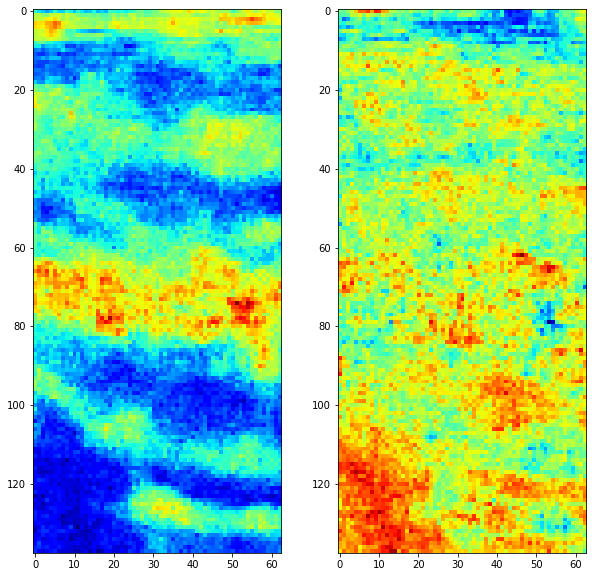

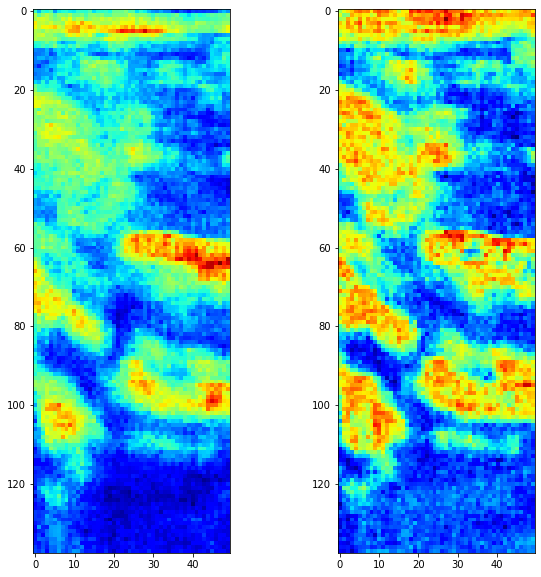

In [ ]:



fig,ax = plt.subplots(1,2,figsize=(10,10))
ch = 0
ax[0].imshow(features[:,:,0,ch],cmap='jet')
ax[1].imshow(features[:,:,0,ch+1],cmap='jet')
plt.show()


fig,ax = plt.subplots(1,2,figsize=(10,10))
ch = 0
ax[0].imshow(features[:,0,:,ch],cmap='jet')
ax[1].imshow(features[:,0,:,-1],cmap='jet')
plt.show()

zoom = tuple([datagen.data.shape[i] / datagen.output_shape[i] for i in range(3)])



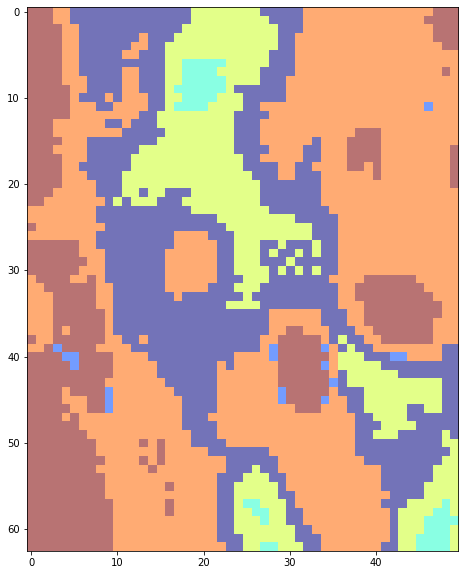

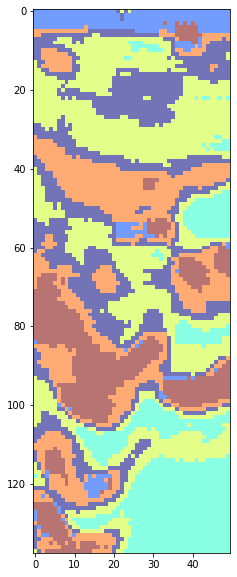

In [ ]:
features = result

clustering = KMeans(
n_clusters=6,random_state=0
)
clustering.fit(features.reshape(-1,128))
clustering_labels = clustering.labels_.reshape(datagen.output_shape)


#plot_pred_wandb(clustering_labels)

fig,ax = plt.subplots(1,1,figsize=(10,10))
ax.imshow(clustering_labels[clustering_labels.shape[0]//2,:,:],alpha=.55,cmap='jet')

plt.show()

fig,ax = plt.subplots(1,1,figsize=(10,10))
ax.imshow(clustering_labels[:,clustering_labels.shape[1]//2,:],alpha=.55,cmap='jet')

plt.show()

In [ ]:
from sklearn.neighbors import KDTree

rows = 5
cols = 5
if KNN_feats:

    kdt = KDTree(features.reshape(-1,features.shape[-1]), leaf_size=30, metric='euclidean')
    dist,nn = kdt.query(features.reshape(-1,features.shape[-1]), k=len(datagen.inds), return_distance=True)




    fig,ax = plt.subplots(rows,cols,figsize=(15,15),sharey=True, sharex=True)
    for i in range(rows):
        r = nn[np.random.randint(len(datagen.inds))]
        for j in range(cols):
            x,y,z = datagen.inds[r[j]]
            ax[i,j].set_title(f'{(x,y,z)}')
            ax[i,j].imshow(dat_crop[x-PATCH_SIZE[0]//2:x+PATCH_SIZE[0]//2,y,z-PATCH_SIZE[2]//2:z+PATCH_SIZE[2]//2],cmap='gray')
plt.tight_layout()

<Figure size 432x288 with 0 Axes>

In [ ]:
from sklearn.manifold import TSNE
fontsize = 8
method = 'pca'
if KNN_feats:
    for k,v in model_dict.items():
        imagelist=[]
        for ind in datagen.inds:
            x,y,z = ind
            temp = dat_crop[x-PATCH_SIZE[0]//2:x+PATCH_SIZE[0]//2,y,z-PATCH_SIZE[2]//2:z+PATCH_SIZE[2]//2]
            #temp = temp[::2,::2]
            imagelist.append(temp)
        imagelist = np.array(imagelist)

        if method == 'tsne':
            embeddings = TSNE(n_components=2, perplexity=3).fit_transform(v.reshape(-1,v.shape[-1]))
        else:
            method = 'pca'
            embeddings = PCA(n_components=2).fit_transform(v.reshape(-1,v.shape[-1]))

        embeddings = embeddings / np.linalg.norm(embeddings)

        print(imagelist.shape)

        step = 2
        x = embeddings[::step,0]
        y = embeddings[::step,1]
        ims = imagelist[::step,:,:]


        plt.figure(dpi=800)
        plt.scatter(x, y)

        # Customize the appearance of the plot, add labels, titles, etc.
        plt.xlabel('x1')
        plt.ylabel('x2')


        # Add the images to the scatter plot
        for i in range(len(x)):
            image = ims[i]  # Load the image from the file
            imgbox = OffsetImage(image, zoom=0.1, cmap='gray')  # Adjust zoom factor as needed
            ab = AnnotationBbox(imgbox, (x[i], y[i]), frameon=False, pad=0)
            plt.gca().add_artist(ab)


        plt.title(f'{k[0].upper() + k[1:]} network embeddings', fontsize= fontsize)
        plt.savefig(f'./figures_final/pca_embedded_{k}_{method}.png')
        plt.show()




In [ ]:
zoom = tuple([datagen.data.shape[i] / datagen.output_shape[i] for i in range(3)])


pred_inds = datagen.inds
min_bounds = np.min(pred_inds,axis=0)
max_bounds = np.max(pred_inds,axis=0)

output_shape = datagen.output_shape
hs = datagen.hs


In [ ]:
"""
from skimage.restoration import unwrap_phase



#from unwrap import unwrap

phase_cube_ = dat
phase_cube_ = scipy.ndimage.gaussian_filter(phase_cube_,(8,8,8))



phase_cube = phase_cube_[pred_inds[:,0],pred_inds[:,1],pred_inds[:,2]]
phase_cube = phase_cube.reshape(datagen.output_shape)
phase_cube = np.angle(scipy.signal.hilbert(phase_cube ,axis=0))
phase_cube = unwrap_phase(phase_cube,rng=42)



backdrop = dat_crop[pred_inds[:,0],pred_inds[:,1],pred_inds[:,2]].reshape(datagen.output_shape)




fig,ax = plt.subplots(1,2,dpi=500,sharey=True)
ax[0].imshow(backdrop[:,0,:],cmap='gray')
ax[1].imshow(phase_cube[:,0,:],cmap='jet')
plt.show()
"""


"\nfrom skimage.restoration import unwrap_phase\n\n\n\n#from unwrap import unwrap\n\nphase_cube_ = dat\nphase_cube_ = scipy.ndimage.gaussian_filter(phase_cube_,(8,8,8))\n\n\n\nphase_cube = phase_cube_[pred_inds[:,0],pred_inds[:,1],pred_inds[:,2]]\nphase_cube = phase_cube.reshape(datagen.output_shape)\nphase_cube = np.angle(scipy.signal.hilbert(phase_cube ,axis=0))\nphase_cube = unwrap_phase(phase_cube,rng=42)\n\n\n\nbackdrop = dat_crop[pred_inds[:,0],pred_inds[:,1],pred_inds[:,2]].reshape(datagen.output_shape)\n\n\n\n\nfig,ax = plt.subplots(1,2,dpi=500,sharey=True)\nax[0].imshow(backdrop[:,0,:],cmap='gray')\nax[1].imshow(phase_cube[:,0,:],cmap='jet')\nplt.show()\n"

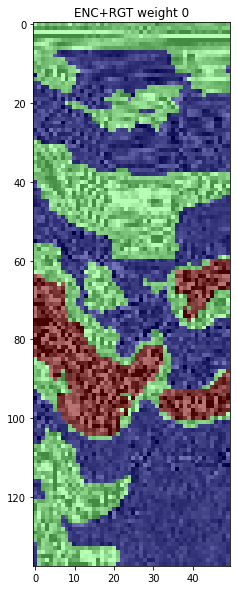

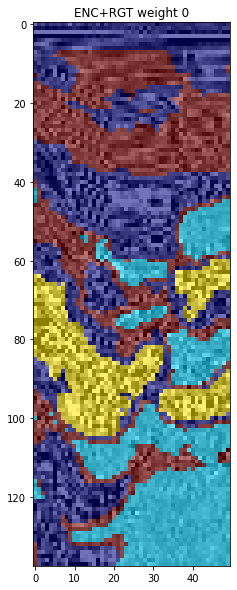

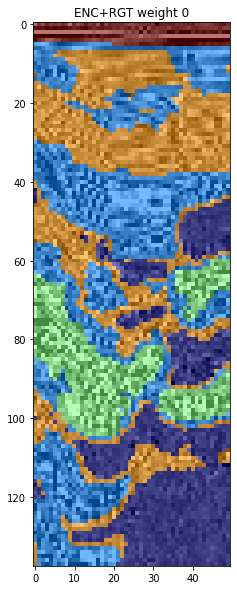

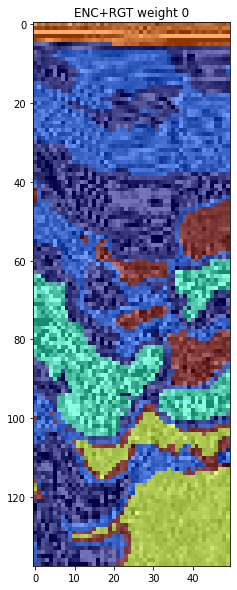

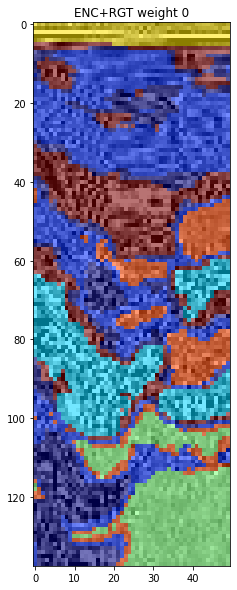

KeyboardInterrupt: 

In [ ]:
from sklearn.cluster import KMeans
from sklearn.feature_extraction.image import grid_to_graph
from sklearn.mixture import GaussianMixture
import numpy as np
from sklearn.decomposition import PCA

label_volumes = []

clusters = np.arange(3,10)
methods = ["ENC+RGT"]


p = [0]




PLOT_VIEW = 'IL'
ALGO = 'agg'




output_names = list(itertools.product(methods,p,clusters))

if len(p) > 1:
    output_names = [("RGT",0,clusters[0])] + output_names




backdrop = dat[::down_samp[0],::down_samp[1],::down_samp[2]]

p2,p98 = np.percentile(backdrop, (5, 95))
backdrop = exposure.rescale_intensity(backdrop,in_range=(p2,p98))
backdrop = backdrop[pred_inds[:,0],pred_inds[:,1],pred_inds[:,2]].reshape(datagen.output_shape)
connectivity = grid_to_graph(*backdrop.shape)

for elem in output_names:
    method, p_, n = elem



    features_temp =  features.reshape(-1,128)
    phase_cube_temp = phase_cube.reshape(-1,1)



    if method == "RGT":
        title = f'{method}'
        features_temp = phase_cube_temp
    elif method == "ENC":
        title = f'{method}'
        features_temp = features_temp
    else:
        title = f'{method} weight {p_}'


        if p_ == 0:
            features_temp = features_temp
        else:
            features_temp = np.concatenate((features_temp ,(p_ / features_temp.shape[-1])*phase_cube_temp),axis=-1)



    assert ALGO in ["agg", "kmeans","gmm"]

    if ALGO == "agg":
        clustering = AgglomerativeClustering(
            n_clusters=n, linkage="ward", connectivity=connectivity
        )
        clustering.fit(features_temp)
        clustering_labels = clustering.labels_.reshape(datagen.output_shape)

    if ALGO == "kmeans":
        clustering = KMeans(
        n_clusters=n,random_state=0
        )
        clustering.fit(features_temp)
        clustering_labels = clustering.labels_.reshape(datagen.output_shape)

    if ALGO == "gmm":
        clustering = GaussianMixture(n_components=n,warm_start=True,covariance_type='full',random_state=0).fit_predict(features_temp)
        clustering_labels = clustering.reshape(datagen.output_shape)




    clustering_labels = clustering_labels.astype(np.int8)
    label_volumes.append(clustering_labels)


    fig,ax = plt.subplots(1,1,figsize=(10,10))
    ax.set_title(f'{title}')


    if PLOT_VIEW == 'IL':
        ax.imshow(backdrop[:,clustering_labels.shape[1]//2,:],cmap='gray')
        ax.imshow(clustering_labels[:,clustering_labels.shape[1]//2,:],alpha=.55,cmap='jet')

    if  PLOT_VIEW == 'XL':
        ax.imshow(backdrop[:,:,clustering_labels.shape[2]//2],cmap='gray')
        ax.imshow(clustering_labels[:,:,clustering_labels.shape[2]//2],alpha=.55,cmap='jet')


    plt.show()



In [ ]:

def relabel_by_depth(label_map):
    """
    Relabel the label_map based on the depth (z-values) of the centroids.

    :param label_map: 3D numpy array of labels.
    :return: Relabeled label map.
    """

    # 1. Compute the centroids
    centroids = {}
    unique_labels = np.unique(label_map)
    for label in unique_labels:
        if label == 0:  # assuming 0 is the background label; skip it
            continue
        z, y, x = np.where(label_map == label)  # get all the voxel coordinates with this label
        centroids[label] = (z.mean(), x.mean(), y.mean())

    # 2. Sort labels by the z-values of centroids
    sorted_labels = sorted(centroids.keys(), key=lambda k: centroids[k][0])

    # 3. Create a mapping from old labels to new ones
    label_mapping = {label: i for i, label in enumerate(sorted_labels, start=1)}

    # 4. Relabel the label_map using the mapping
    relabeled_map = np.copy(label_map)
    for old_label, new_label in label_mapping.items():
        relabeled_map[label_map == old_label] = new_label

    return relabeled_map






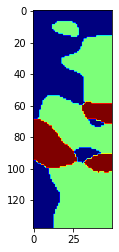

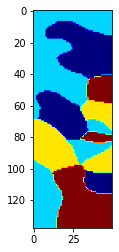

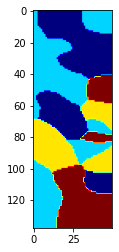

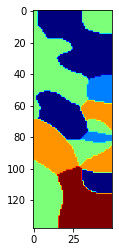

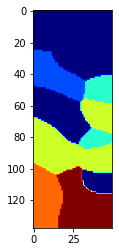

In [ ]:
import numpy as np
from scipy.ndimage import binary_closing, binary_opening, gaussian_filter

def smooth_boundaries(label_map, sigma=5):


    smoothed_map = np.zeros_like(label_map)
    unique_labels = np.unique(label_map)

    for label in unique_labels:
        if label == 0:  # assuming 0 is the background label; skip it
            continue

        # Extract the binary map for the current label
        binary_map = (label_map == label)

        # Apply morphological operations
        binary_map = binary_closing(binary_map, structure=np.ones((sigma,sigma,sigma)))
        binary_map = binary_opening(binary_map, structure=np.ones((sigma,sigma,sigma)))

        # Apply Gaussian smoothing and threshold back to binary
        smoothed_binary_map = gaussian_filter(binary_map.astype(float), sigma=sigma)
        binary_map = (smoothed_binary_map > 0.5)

        smoothed_map[binary_map] = label

    return smoothed_map

label_volumes_final = []
for l in label_volumes:
    smoothed_map = smooth_boundaries(l + 1)
    smoothed_map = relabel_by_depth(smoothed_map)
    smoothed_map = skimage.segmentation.expand_labels(smoothed_map, distance=18)

    label_volumes_final.append(smoothed_map)
    plt.imshow(smoothed_map[:,20,:],cmap='jet')
    plt.show()

In [ ]:
if len(p) == 1:
    titles = [f"$\\lambda$ = {p[0]} | n = {clusters[i]}" for i in range(len(clusters))]
    fig_name = 'param_search_clusters.png'
else:
    titles = ['RGT'] + [f"$\\lambda$ = {p[i]}" for i in range(len(p))]
    fig_name = 'param_search_lambda.png'
print(titles)

['$\\lambda$ = 0 | n = 3', '$\\lambda$ = 0 | n = 4', '$\\lambda$ = 0 | n = 5', '$\\lambda$ = 0 | n = 6', '$\\lambda$ = 0 | n = 7', '$\\lambda$ = 0 | n = 8', '$\\lambda$ = 0 | n = 9']


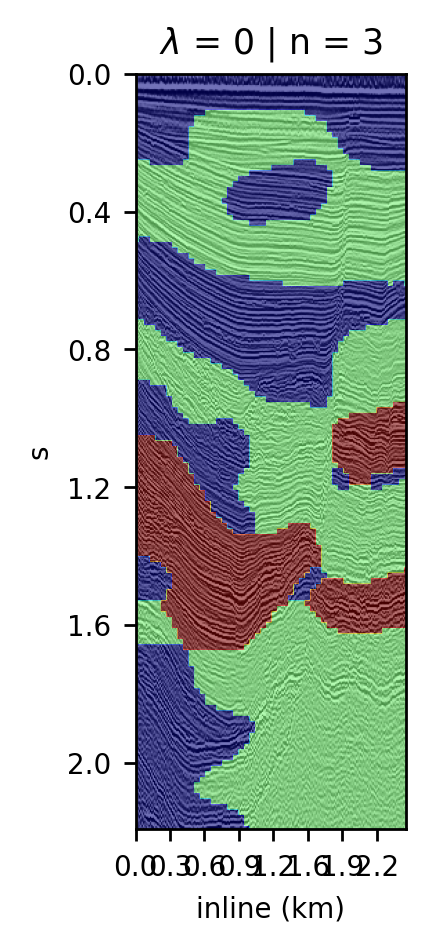

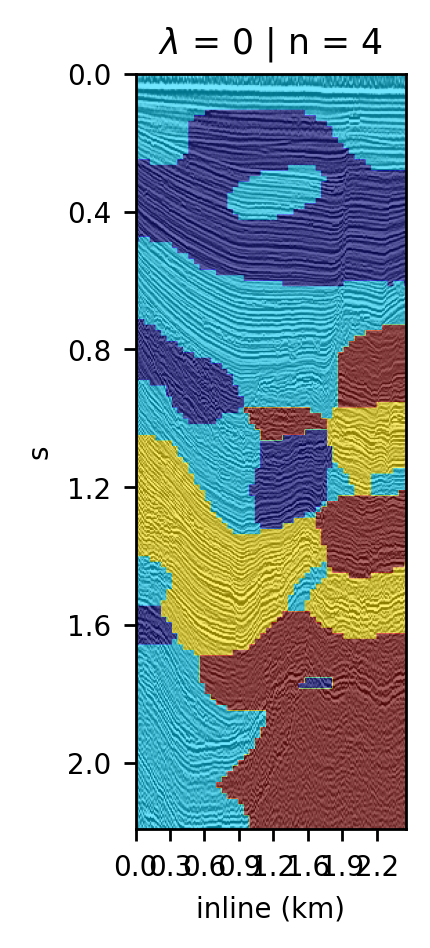

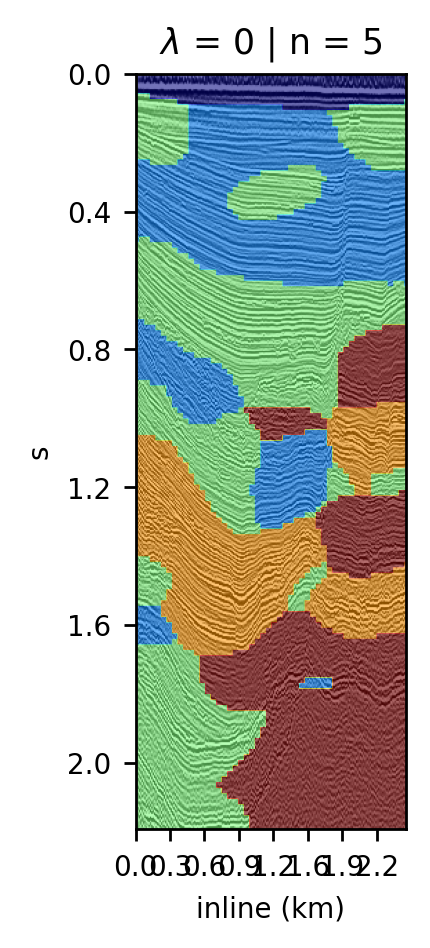

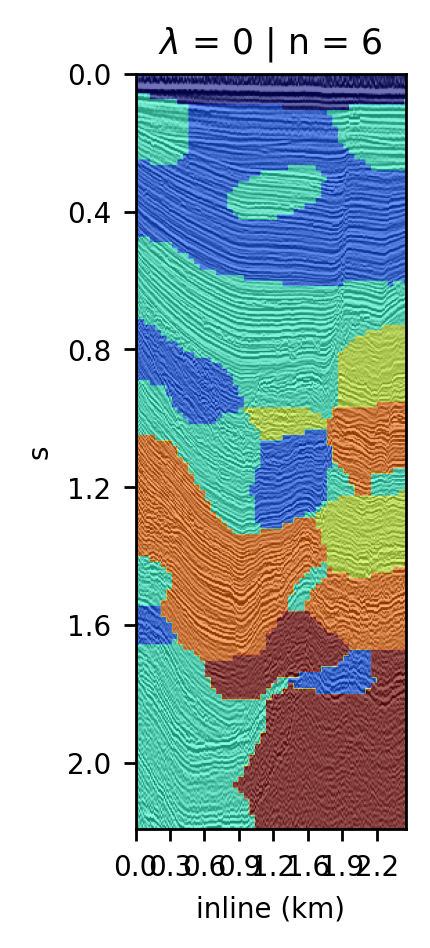

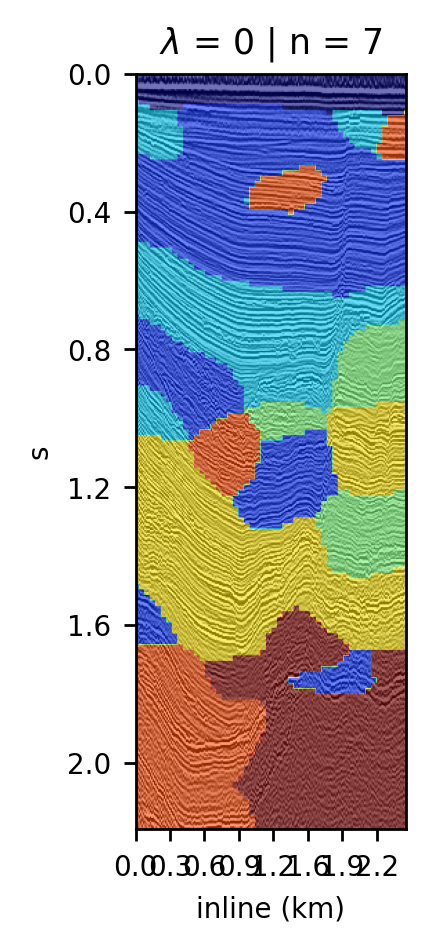

In [ ]:
DPI=250
fontsize = 8
dx = 12.5; dt = 0.004
PAD = False

def upscale_prediction(pred,datagen):
    pred_inds = datagen.inds
    minb = np.min(pred_inds,axis=0)
    maxb = np.max(pred_inds,axis=0)
    clustering_labels = pred
    backdrop = phase_cube_[pred_inds[:,0],pred_inds[:,1],pred_inds[:,2]].reshape(datagen.output_shape)

    labels_out = clustering_labels

    seis_cropped = datagen.data[minb[0]:maxb[0],minb[1]:maxb[1],minb[2]:maxb[2]]
    zoom = tuple([seis_cropped.shape[i] / labels_out.shape[i] for i in range(3)])
    interp = ndimage.zoom(labels_out,zoom,order=0)
    return interp, seis_cropped



for ind,best_label in enumerate(label_volumes_final):

    #best_label = label_volumes_final[1]
    title = titles[ind]#titles[1]

    temp_pred, seis_cropped = upscale_prediction(best_label,datagen)


    ind_il = seis_cropped.shape[1]//2
    shape = seis_cropped[:,ind_il,:].shape
    extent = [0, shape[1], shape[0], 0]



    fig,ax = plt.subplots(1,1,dpi = DPI)

    ax.imshow(exposure.equalize_hist(seis_cropped[:,ind_il,:]),
              cmap="gray",extent=extent
              )

    ax.imshow(temp_pred[:,ind_il,:],
              alpha=.55,
              cmap='jet',
              extent=extent
             )

    ax.set_title(title,fontsize=fontsize + 2)

    xticks = ax.get_xticks()[:-1]
    xticklabels = np.round(xticks * dx / 1000, 1)

    ax.set_xticks(xticks)
    ax.set_xticklabels(xticklabels,fontsize=fontsize)
    ax.set_xlabel("inline (km)",fontsize=fontsize)

    yticks = ax.get_yticks()[:-1]
    yticklabels = np.round(yticks * dt, 2)
    ax.set_yticks(yticks)
    ax.set_yticklabels(yticklabels,fontsize=fontsize)
    ax.set_ylabel("s",fontsize=fontsize)
    #plt.savefig("./figures_final/figure_main.png")
    plt.show()


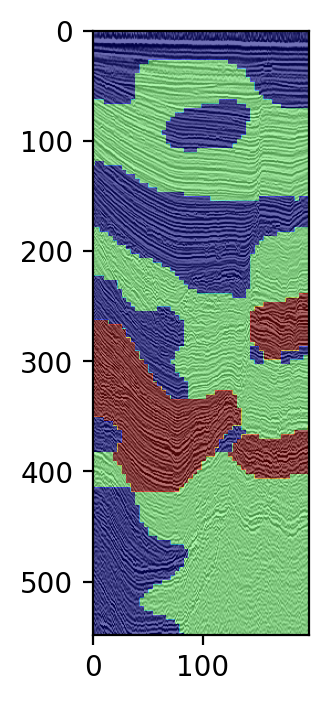

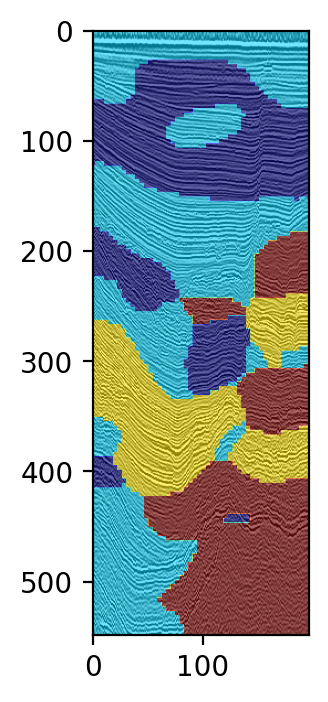

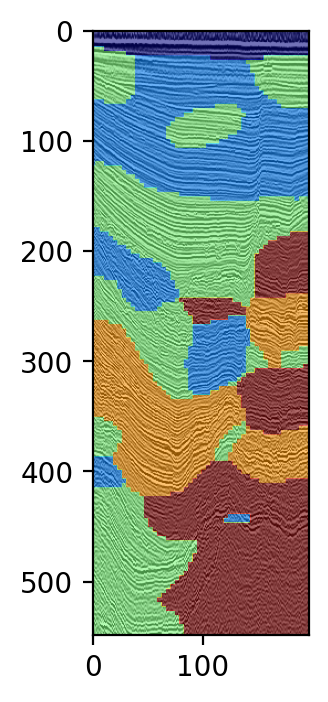

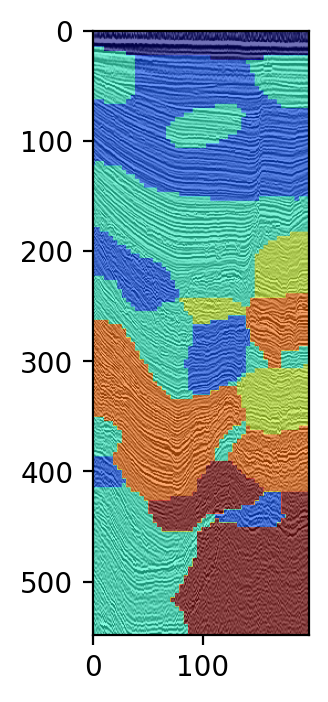

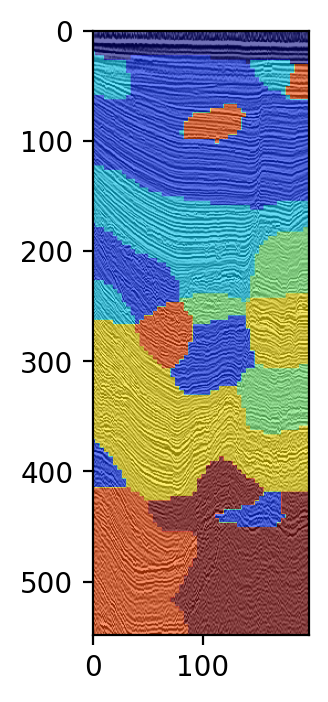

In [ ]:
DPI=200
fontsize = 6
dx = 12.5; dt = 0.004
PAD = False

def upscale_prediction(pred,datagen):
    pred_inds = datagen.inds
    minb = np.min(pred_inds,axis=0)
    maxb = np.max(pred_inds,axis=0)
    clustering_labels = pred
    backdrop = phase_cube_[pred_inds[:,0],pred_inds[:,1],pred_inds[:,2]].reshape(datagen.output_shape)

    labels_out = clustering_labels

    seis_cropped = datagen.data[minb[0]:maxb[0],minb[1]:maxb[1],minb[2]:maxb[2]]
    zoom = tuple([seis_cropped.shape[i] / labels_out.shape[i] for i in range(3)])
    interp = ndimage.zoom(labels_out,zoom,order=0)
    return interp, seis_cropped



for ind,best_label in enumerate(label_volumes_final):

    #best_label = label_volumes_final[1]
    title = titles[ind]#titles[1]

    temp_pred, seis_cropped = upscale_prediction(best_label,datagen)


    ind_il = seis_cropped.shape[1]//2
    shape = seis_cropped[:,ind_il,:].shape
    extent = [0, shape[1], shape[0], 0]



    fig,ax = plt.subplots(1,1,dpi = DPI)

    ax.imshow(exposure.equalize_hist(seis_cropped[:,ind_il,:]),
              cmap="gray",extent=extent
              )

    ax.imshow(temp_pred[:,ind_il,:],
              alpha=.55,
              cmap='jet',
              extent=extent
             )




    plt.show()


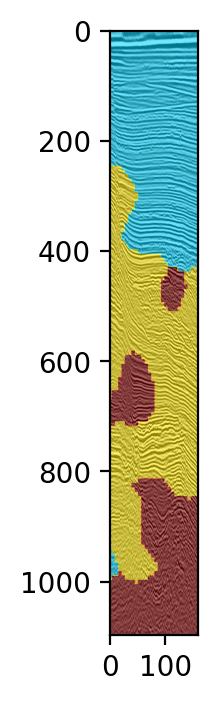

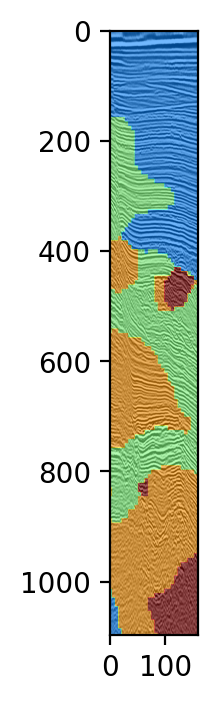

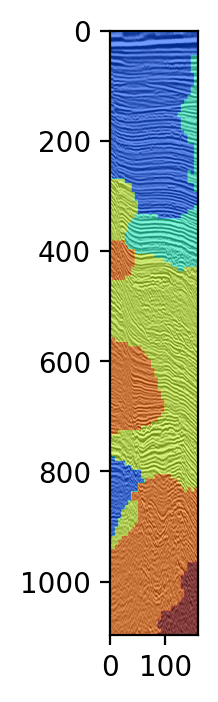

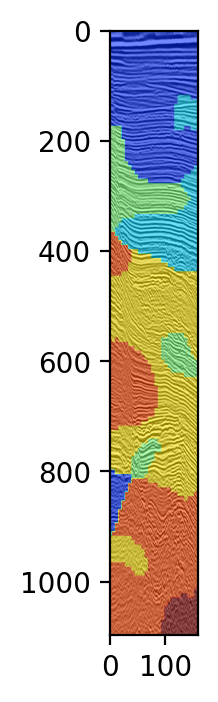

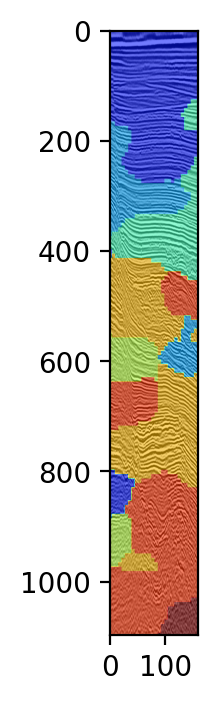

In [ ]:
DPI=200
fontsize = 6
dx = 12.5; dt = 0.004
PAD = False

def upscale_prediction(pred,datagen):
    pred_inds = datagen.inds
    minb = np.min(pred_inds,axis=0)
    maxb = np.max(pred_inds,axis=0)
    clustering_labels = pred
    backdrop = phase_cube_[pred_inds[:,0],pred_inds[:,1],pred_inds[:,2]].reshape(datagen.output_shape)

    labels_out = clustering_labels

    seis_cropped = datagen.data[minb[0]:maxb[0],minb[1]:maxb[1],minb[2]:maxb[2]]
    zoom = tuple([seis_cropped.shape[i] / labels_out.shape[i] for i in range(3)])
    interp = ndimage.zoom(labels_out,zoom,order=0)
    return interp, seis_cropped



for ind,best_label in enumerate(label_volumes_final):

    #best_label = label_volumes_final[1]
    title = titles[ind]#titles[1]

    temp_pred, seis_cropped = upscale_prediction(best_label,datagen)


    ind_xl = seis_cropped.shape[2]//2
    shape = seis_cropped[:,ind_xl,:].shape
    extent = [0, shape[1], shape[0], 0]



    fig,ax = plt.subplots(1,1,dpi = DPI)

    ax.imshow(exposure.equalize_hist(seis_cropped[:,:,ind_xl]),
              cmap="gray",extent=extent
              )

    ax.imshow(temp_pred[:,:,ind_xl],
              alpha=.55,
              cmap='jet',
              extent=extent
             )




    plt.show()


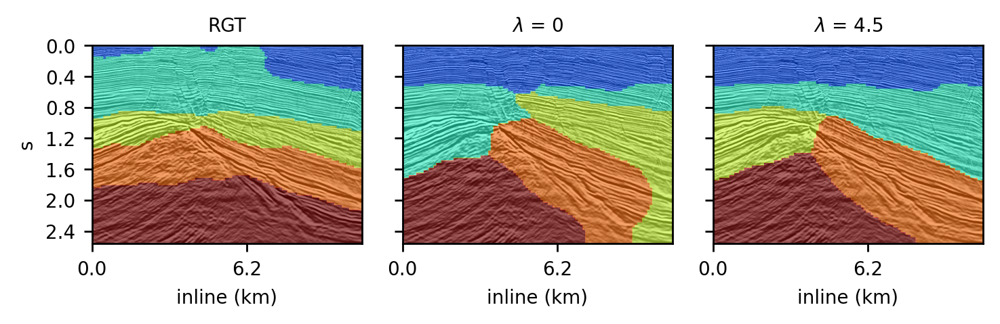

In [ ]:



def upscale_prediction(pred,datagen):
    pred_inds = datagen.inds
    minb = np.min(pred_inds,axis=0)
    maxb = np.max(pred_inds,axis=0)
    clustering_labels = pred
    backdrop = phase_cube_[pred_inds[:,0],pred_inds[:,1],pred_inds[:,2]].reshape(datagen.output_shape)

    labels_out = clustering_labels

    seis_cropped = datagen.data[minb[0]:maxb[0],minb[1]:maxb[1],minb[2]:maxb[2]]
    zoom = tuple([seis_cropped.shape[i] / labels_out.shape[i] for i in range(3)])
    interp = ndimage.zoom(labels_out,zoom,order=0)
    return interp, seis_cropped



fig,axs = plt.subplots(1,3,dpi=DPI,sharey=True)

selected_inds = [0,1,2]


selected_labels = [label_volumes_final[i] for i in selected_inds]
selected_titles = [titles[i] for i in selected_inds]

for i in range(len(selected_labels)):
    temp_pred, seis_cropped = upscale_prediction(selected_labels[i],datagen)

    ax = axs[i]
    ind_il = seis_cropped.shape[1]//2
    shape = seis_cropped[:,ind_il,:].shape
    extent = [0, shape[1], shape[0], 0]

    ax.imshow(exposure.equalize_hist(seis_cropped[:,ind_il,:]),
              cmap="gray",extent=extent
              )

    ax.imshow(temp_pred[:,ind_il,:],
              alpha=.55,
              cmap='jet',
              extent=extent
             )

    ax.set_title(selected_titles[i],fontsize=fontsize)

    xticks = ax.get_xticks()[:-1]
    xticklabels = np.round(xticks * dx / 1000, 1)

    ax.set_xticks(xticks)
    ax.set_xticklabels(xticklabels,fontsize=fontsize)


    ax.set_xlabel("inline (km)",fontsize=fontsize)


ax = axs[0]
yticks = ax.get_yticks()[:-1]
yticklabels = np.round(yticks * dt, 2)
ax.set_yticks(yticks)
ax.set_yticklabels(yticklabels,fontsize=fontsize)
ax.set_ylabel("s",fontsize=fontsize)



plt.savefig(f"./figures_final/{fig_name}")
plt.tight_layout()
plt.show()



In [ ]:

DPI = 400

fontsize = 8
dx = 12.5; dt = 0.004
PAD = False

def upscale_prediction(pred,datagen):

    pred_inds = datagen.inds
    minb = np.min(pred_inds,axis=0)
    maxb = np.max(pred_inds,axis=0)
    clustering_labels = pred
    backdrop = phase_cube_[pred_inds[:,0],pred_inds[:,1],pred_inds[:,2]].reshape(datagen.output_shape)

    """
    erosion_size = tuple([int(PATCH_SIZE[i] / 2 / STRIDES[i] ) for i in range(3)])
    print(erosion_size)
    median_filter_ksize = erosion_size
    clustering_labels = clustering_labels##ndimage.median_filter(clustering_labels,median_filter_ksize) + 1

    num_classes = len(np.unique(clustering_labels))
    onehot = np.zeros((*clustering_labels.shape, num_classes),dtype=int)
    """



    labels_out = clustering_labels

    seis_cropped = datagen.data[minb[0]:maxb[0],minb[1]:maxb[1],minb[2]:maxb[2]]
    zoom = tuple([seis_cropped.shape[i] / labels_out.shape[i] for i in range(3)])
    interp = ndimage.zoom(labels_out,zoom,order=0)
    return interp, seis_cropped

for i in range(len(label_volumes)):
    temp_pred, seis_cropped = upscale_prediction(label_volumes[i],datagen)

    fig,ax = plt.subplots(1,1,dpi=DPI,sharey=True)
    ind_xl = seis_cropped.shape[-1]//2
    shape = seis_cropped[:,:,ind_xl].shape
    extent = [0, shape[1], shape[0], 0]

    ax.imshow(exposure.equalize_hist(seis_cropped[:,:,ind_xl]),
              cmap="gray",extent=extent
              )

    ax.imshow(temp_pred[:,:,ind_xl],
              alpha=.55,
              cmap='jet',
              extent=extent
             )


    yticks = ax.get_yticks()[:-1]
    yticklabels = np.round(yticks * dt, 2)
    ax.set_yticks(yticks)
    ax.set_yticklabels(yticklabels,fontsize=fontsize)

    xticks = ax.get_xticks()[:-1]
    xticklabels = np.round(xticks * dx / 1000, 1)

    ax.set_xticks(xticks)
    ax.set_xticklabels(xticklabels,fontsize=fontsize)


    ax.set_xlabel("inline (km)",fontsize=fontsize)
    ax.set_ylabel("s",fontsize=fontsize)


    plt.tight_layout()
    plt.show()



In [ ]:
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

import numpy.ma as ma
import cc3d

import matplotlib
matplotlib.rcParams.update({'font.size': 8})


def norm_cmap(n):
    n_clusts = n
    jet = cm.get_cmap('jet', n_clusts)
    newcolors = jet(np.linspace(0, 1, n_clusts + 1))
    red = np.array([1, 0, 0, 1])
    newcmp = ListedColormap(newcolors)
    norm=plt.Normalize(0,n_clusts)
    return newcmp,norm





hs = datagen.hs


l_out = []

pred_inds = datagen.inds
minb = np.min(pred_inds,axis=0)
maxb = np.max(pred_inds,axis=0)

label_volumes2 = [label_volumes[0],label_volumes[1],label_volumes[2],label_volumes[-1]]


for ind in range(len(label_volumes2)):


    labels_out = label_volumes2[ind]
    seis_cropped = datagen.data[minb[0]:maxb[0],minb[1]:maxb[1],minb[2]:maxb[2]]
    zoom = tuple([seis_cropped.shape[i] / labels_out.shape[i] for i in range(3)])



    pred_inds = datagen.inds
    minb = np.min(pred_inds,axis=0)
    maxb = np.max(pred_inds,axis=0)

    seis_cropped = datagen.data[minb[0]:maxb[0],minb[1]:maxb[1],minb[2]:maxb[2]]
    zoom = tuple([seis_cropped.shape[i] / labels_out.shape[i] for i in range(3)])
    interp = ndimage.zoom(labels_out,zoom,order=0)





    labels_new = np.zeros(datagen.data.shape) - 1
    labels_new[minb[0]:maxb[0],minb[1]:maxb[1],minb[2]:maxb[2]] = interp
    labels_new = ma.masked_equal(labels_new, -1)


    n_clusts = len(np.unique(labels_new)) + 1
    newcmp,norm = norm_cmap(n_clusts)

    ind_il = datagen.data.shape[1]//2
    ind_xl = datagen.data.shape[2]//2

    fig,ax = plt.subplots(1,2,dpi=1000,sharey=True)
    ax[0].set_title(f'inline {ind_il}, weight {output_names[ind]}')
    ax[0].imshow(exposure.equalize_hist(datagen.data[:,ind_il,:]),cmap="gray")
    ax[0].imshow(labels_new[:,ind_il,:],alpha=0.6,aspect='auto',cmap=newcmp,norm=norm)

    ax[1].set_title(f'xline {ind_xl}, weight {output_names[ind]}')
    ax[1].imshow(exposure.equalize_hist(datagen.data[:,:,ind_xl]),cmap="gray")
    ax[1].imshow(labels_new[:,:,ind_xl],alpha=0.6,aspect='auto',cmap=newcmp,norm=norm)
    l_out.append(labels_new.astype(np.int8))

    plt.show()




    #np.save(f"saved_labels/labels_topseis_final/labels_weight_{weights[ind]}.npy",labels_new.data.astype(np.int16))


In [ ]:
#MAKING VOLUME!
from sklearn.cluster import KMeans
from sklearn.feature_extraction.image import grid_to_graph
label_volumes = []

clusters = [6]#np.arange(4,12)
methods = ["ENC+RGT"]
p = [0] + list(np.arange(38,46,1))






output_names = list(itertools.product(methods,p,clusters))
print(output_names,"\n")
output_names = [("RGT",0,clusters[0])] + output_names


backdrop = phase_cube_[pred_inds[:,0],pred_inds[:,1],pred_inds[:,2]].reshape(datagen.output_shape)
connectivity = grid_to_graph(*backdrop.shape)



for elem in output_names:
    method, p_, n = elem

    features_temp = features
    phase_cube_temp = phase_cube.reshape(-1,1)#phase_cube[pred_inds[:,0],pred_inds[:,1],pred_inds[:,2]][...,None]#phase_cube.reshape(-1,1)



    if method == "RGT":
        title = f'{method}'
        feature_volume = phase_cube_temp
    elif method == "ENC":
        title = f'{method}'
        feature_volume = features_temp
    else:
        title = f'{method} weight {p_}'
        feature_volume = np.concatenate((features_temp ,(p_/features_temp.shape[-1])*phase_cube_temp),axis=-1)


    clustering = AgglomerativeClustering(
        n_clusters=n, linkage="ward", connectivity=connectivity
    )
    clustering.fit(feature_volume)
    """
    clustering = KMeans(
        n_clusters=n
    )
    clustering.fit(feature_volume.reshape(-1,feature_volume.shape[-1]))
    """


    clustering_labels = clustering.labels_.reshape(datagen.output_shape)
    clustering_labels = clustering_labels.astype(np.int8)
    clustering_labels = scipy.ndimage.median_filter(clustering_labels,size=3)


    n_clusts = len(np.unique(clustering_labels))
    newcmp,norm = norm_cmap(n_clusts)

    fig,ax = plt.subplots(1,1,dpi=500)
    #ax.set_title(f'{title}')

    ax.imshow(backdrop[:,0,:],cmap='gray')
    ax.imshow(clustering_labels[:,0,:],alpha=.55,cmap=newcmp,norm=norm)
    ax.set_xticks([])
    ax.set_yticks([])
    plt.show()


    fig,ax = plt.subplots(1,1,dpi=500)
    ax.imshow(backdrop[:,:,-1],cmap='gray')
    ax.imshow(clustering_labels[:,:,-1],alpha=.55,cmap=newcmp,norm=norm)
    ax.set_xticks([])
    ax.set_yticks([])
    plt.show()


    plt.show()

    fig,ax = plt.subplots(1,1,dpi=500)
    ax.imshow(backdrop[0,:,:],cmap='gray')
    ax.imshow(clustering_labels[0,:,:],alpha=.55,cmap=newcmp,norm=norm)
    ax.set_xticks([])
    ax.set_yticks([])
    plt.show()


    plt.show()


    label_volumes.append(clustering_labels)


In [ ]:
def norm_cmap(n):
    n_clusts = n
    jet = cm.get_cmap('jet', n_clusts)
    newcolors = jet(np.linspace(0, 1, n_clusts))
    red = np.array([1, 0, 0, 1])
    newcmp = ListedColormap(newcolors)
    norm=plt.Normalize(0,n_clusts)
    return newcmp,norm




#MAKING VOLUME INTERPOLATION!
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

import numpy.ma as ma
import cc3d
import re
import matplotlib

binsize=25
dt = 0.004

#for ind in range(len(label_volumes[-1:])):

pred_inds = datagen.inds
minb = np.min(pred_inds,axis=0)
maxb = np.max(pred_inds,axis=0)


labels_out = label_volumes2[-1]



seis_cropped = datagen.data[minb[0]:maxb[0]-1,minb[1]:maxb[1]-1,minb[2]:maxb[2]-1]
zoom = tuple([seis_cropped.shape[i] / labels_out.shape[i] for i in range(3)])
interp = ndimage.zoom(labels_out,zoom,order=0)



labels_new = interp



n_clusts = len(np.unique(labels_new)) + 3
newcmp,norm = norm_cmap(n_clusts)


fig,ax = plt.subplots(1,1,dpi=500)
ax.imshow(seis_cropped[:,0,:],cmap='gray')
ax.imshow(labels_new[:,0,:],alpha=.55,cmap=newcmp,norm=norm)

temp = [str(item*binsize / 1000) for item in ax.get_xticks()]
ax.set_xticklabels(temp)

temp = [str(np.round(item*dt,1)) for item in ax.get_yticks()]
ax.set_yticklabels(temp)

plt.show()



fig,ax = plt.subplots(1,1,dpi=500)
ax.imshow(seis_cropped[:,:,-1],cmap='gray')
ax.imshow(labels_new[:,:,-1],alpha=.55,cmap=newcmp,norm=norm)
ax.set_yticks([])
temp = [str(item*binsize / 1000) for item in ax.get_xticks()]
ax.set_xticklabels(temp)
plt.show()



fig,ax = plt.subplots(1,1,dpi=500)
ax.imshow(seis_cropped[0,:,:],cmap='gray')
ax.imshow(labels_new[0,:,:],alpha=.55,cmap=newcmp,norm=norm)
ax.set_xticks([])
ax.set_yticks([])
plt.show()


plt.show()





In [ ]:
fig,ax = plt.subplots(2,2,figsize=(24,24),sharey=True,sharex=True,constrained_layout=True)
temp_out = [l_out[3],l_out[6],l_out[-3],l_out[-1]]
title_out = [output_names[3],output_names[6],output_names[-3],output_names[-1]]
for ind in range(len(temp_out)):



    ind_il = datagen.data.shape[1]//2
    ind_xl = datagen.data.shape[2]//2
    title = title_out[ind]



    n_clusts = len(np.unique(temp_out[ind])) + 1
    newcmp,norm = norm_cmap(n_clusts)

    ax.flat[ind].set_title(f'inline {ind_il}, {title}')
    ax.flat[ind].imshow(exposure.equalize_hist(datagen.data[:,ind_il,:]),cmap="gray")
    ax.flat[ind].imshow(temp_out[ind][:,ind_il,:],alpha=0.6,aspect='auto',cmap=newcmp,norm=norm)

    #ax[1].set_title(f'xline {ind_xl}, {title}')
    #ax[1].imshow(exposure.equalize_hist(datagen.data[:,:,ind_xl]),cmap="gray")
    #ax[1].imshow(temp_out[:,:,ind_xl],alpha=0.6,aspect='auto',cmap='jet')


plt.show()






In [ ]:
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

import cc3d
def norm_cmap(n):

    jet = cm.get_cmap('jet', n_clusts)
    newcolors = jet(np.linspace(0, 1, n+1))
    red = np.array([1, 0, 0, 1])
    newcmp = ListedColormap(newcolors)
    norm=plt.Normalize(0,n_clusts)
    return newcmp,norm

output_names = list(itertools.product(methods,p,clusters))
#output_names = [('cnn',0,clusters),('phase',0,clusters)] + output_names


seis_cropped = datagen.data[min_bounds[0]:max_bounds[0],min_bounds[1]:max_bounds[1],min_bounds[2]:max_bounds[2]]

zoom = STRIDES

hs = datagen.hs
print(hs)
ind_il = dat.shape[1]//2
ind_xl = dat.shape[2]//2
l_out = []




#all_labels = saved + label_volumes
all_labels = label_volumes


import numpy.ma as ma
for ind in range(len(all_labels)):

    n_clusts = len(np.unique(all_labels[ind]))
    newcmp,norm = norm_cmap(n_clusts)

    labels_out = all_labels[ind]
    labels_interp = scipy.ndimage.zoom(labels_out,zoom,order=0)

    labels_new = np.ones(datagen.data.shape) * -1


    labels_new[hs[0]:-hs[0],
               hs[1]-3:-hs[1]+4,
               hs[2]-5:-hs[2]+6] = labels_interp
    labels_new =  scipy.ndimage.zoom(labels_new,down_samp,order=0)
    labels_new = ma.masked_equal(labels_new, -1)


    fig,ax = plt.subplots(1,1,figsize=(24,12),sharey=True)
    ax.set_title(f'inline {ind_il}, weight {output_names[ind]}')
    ax.imshow(exposure.equalize_hist(dat[:,ind_il,:]),cmap="gray")
    ax.imshow(labels_new[:,ind_il,:],cmap=newcmp,alpha=0.6,norm=norm)
    plt.show()

    fig,ax = plt.subplots(1,1,figsize=(24,12),sharey=True)
    ax.set_title(f'xline {ind_xl}, weight {output_names[ind]}')
    ax.imshow(exposure.equalize_hist(dat[:,:,ind_xl]),cmap="gray")
    ax.imshow(labels_new[:,:,ind_xl],cmap=newcmp,alpha=0.6,norm=norm)

    plt.show()


In [ ]:
l_out[0].shape

In [ ]:
seis_cropped = datagen.data[min_bounds[0]:max_bounds[0],min_bounds[1]:max_bounds[1],min_bounds[2]:max_bounds[2]]
print(seis_cropped.shape)

data = np.load("saved_labels/horda/labels_interp_horda_clusters_10.npy")
print(data.shape)


ind_il = seis_cropped.shape[1]//2
ind_xl = seis_cropped.shape[2]//2

fig,ax = plt.subplots(1,1,figsize=(8,16),sharey=True)
#ax.set_title(f'inline {ind_il}, weight {np.round(weights,2)}')
ax.imshow(exposure.equalize_hist(seis_cropped[:,ind_il,:]),cmap="gray")
ax.imshow(data[:,ind_il,4:-4],cmap="jet",alpha=0.5)
plt.show()

fig,ax = plt.subplots(1,1,figsize=(8,16),sharey=True)
#ax.set_title(f'xline {ind_xl}, weight {np.round(weights,2)}')
ax.imshow(exposure.equalize_hist(seis_cropped[:,:,ind_xl]),cmap="gray")
ax.imshow(data[:,:,ind_xl],cmap="jet",alpha=0.5)
plt.show()


In [ ]:
temp_labels = label_volumes[0]
weights = 0.8


labels_interp = scipy.ndimage.zoom(temp_labels,zoom,order=0)[STRIDES[0]//2:-STRIDES[0]//2,STRIDES[1]//2:-STRIDES[1]//2,STRIDES[2]//2:-STRIDES[2]//2]
labels_out = labels_interp.astype(np.uint8)## cc3d.connected_components(labels_interp.astype(np.uint8)) # 26-connected

np.save('saved_labels/f3/labels_pre.npy',labels_interp.astype(np.uint8))


#stat1 = cc3d.statistics(labels_out)
fig,ax = plt.subplots(2,2,figsize=(24,16))
ax[0,0].set_title(f'inline {ind_il}, weight {np.round(weights,2)}')
ax[0,0].imshow(exposure.equalize_hist(seis_cropped[:,ind_il,:]),cmap="gray")
ax[0,0].imshow(labels_interp[:,ind_il,:],cmap="jet",alpha=0.5,aspect='auto')

ax[0,1].set_title(f'xline {ind_xl}, weight {np.round(weights,2)}')
ax[0,1].imshow(exposure.equalize_hist(seis_cropped[:,:,ind_xl]),cmap="gray")
ax[0,1].imshow(labels_interp[:,:,ind_xl],cmap="jet",alpha=0.5,aspect='auto')


window = (2,8,8)
temp = scipy.ndimage.grey_opening(temp_labels,footprint=np.ones(window))
temp = scipy.ndimage.median_filter(temp,window)
window = (2,2,2)
temp = scipy.ndimage.grey_closing(temp,footprint=np.ones(window))
#

#window = (4,8,8)

labels_out = temp.astype(np.uint8)#cc3d.connected_components(temp.astype(np.uint8)) # 26-connected
stat2 = cc3d.statistics(labels_out)
labels_interp = scipy.ndimage.zoom(labels_out,zoom,order=0)[STRIDES[0]//2:-STRIDES[0]//2,STRIDES[1]//2:-STRIDES[1]//2,STRIDES[2]//2:-STRIDES[2]//2]
np.save('saved_labels/f3/labels_post.npy',labels_interp.astype(np.uint8))

ax[1,0].set_title(f'inline {ind_il}, weight {np.round(weights,2)}')
ax[1,0].imshow(exposure.equalize_hist(seis_cropped[:,ind_il,:]),cmap="gray")
ax[1,0].imshow(labels_interp[:,ind_il,:],cmap="jet",alpha=0.5,aspect='auto')

ax[1,1].set_title(f'xline {ind_xl}, weight {np.round(weights,2)}')
ax[1,1].imshow(exposure.equalize_hist(seis_cropped[:,:,ind_xl]),cmap="gray")
ax[1,1].imshow(labels_interp[:,:,ind_xl],cmap="jet",alpha=0.5,aspect='auto')


In [ ]:
labels_interp = scipy.ndimage.zoom(temp,zoom,order=0)[STRIDES[0]//2:-STRIDES[0]//2,STRIDES[1]//2:-STRIDES[1]//2,STRIDES[2]//2:-STRIDES[2]//2]
print(labels_interp.shape)
print(datagen.data.shape)


In [ ]:
feature_volume = features.reshape(*datagen.output_shape,features.shape[-1])
feature_volume = np.concatenate((exposure.equalize_hist(feature_volume),exposure.equalize_hist(phase_cube)[...,None]),axis=-1)



label_volumes = []
connectivity = grid_to_graph(*feature_volume.shape[:-1])
clusters = np.arange(4,12+1)

for n in clusters:

    feature_volume = features.reshape(*datagen.output_shape,features.shape[-1])
    feature_volume = exposure.equalize_hist(feature_volume) + (exposure.equalize_hist(phase_cube)[...,None] * 0.8)

    clustering = AgglomerativeClustering(
        n_clusters=n, linkage="ward", connectivity=connectivity
    )
    clustering.fit(feature_volume.reshape(-1,feature_volume.shape[-1]))
    clustering_labels = clustering.labels_.reshape(datagen.output_shape)

    fig,ax = plt.subplots(1,2,figsize=(10,10))
    ax[0].imshow(feature_volume[:,0,:,0],cmap='jet')
    ax[1].imshow(clustering_labels[:,0,:],cmap='jet')
    plt.show()
    label_volumes.append(clustering_labels)


In [ ]:
import cc3d


seis_cropped = datagen.data[min_bounds[0]:max_bounds[0],min_bounds[1]:max_bounds[1],min_bounds[2]:max_bounds[2]]
zoom = STRIDES



ind_il = seis_cropped.shape[1]//2
fig,ax = plt.subplots(3,3,figsize=(20,10),sharey=True,sharex=True)
for ind,a in enumerate(ax.flat):
    labels_out = cc3d.connected_components(label_volumes[ind].astype(np.uint8)) # 26-connected

    stat = cc3d.statistics(labels_out)
    temp = stat["centroids"]
    temp[:,1] = np.arange(len(temp[:,1]))
    temp = temp[temp[:, 0].argsort()]
    temp[:,-1] = np.arange(len(temp[:,-1]))

    labels_new = np.ones(labels_out.shape) * -1
    for i in range(temp.shape[0]):
        labels_new[labels_out == temp[:,1][i]] = temp[:,2][i]





    #stat = cc3d.statistics(labels_out)
    labels_interp = scipy.ndimage.zoom(labels_new,zoom,order=0)[STRIDES[0]//2:-STRIDES[0]//2,STRIDES[1]//2:-STRIDES[1]//2,STRIDES[2]//2:-STRIDES[2]//2]
    a.set_title(f'inline {ind_il}, num clusters {clusters[ind]}')
    a.imshow(exposure.equalize_hist(seis_cropped[:,ind_il,:]),cmap="gray")
    a.imshow(labels_interp[:,ind_il,:],cmap="jet",alpha=0.5,vmin=0,vmax=len(np.unique(labels_new)))

    #np.save(f'saved_labels/f3/labels_interp_f3_clusters_{clusters[ind]}.npy',labels_interp.astype(np.uint8))

plt.tight_layout()

In [ ]:


fig,ax = plt.subplots(1,1)
ax.imshow(labels_new[:,0,:] + 1,cmap='jet')
ax.set_aspect('equal')


In [ ]:
ind_xl = seis_cropped.shape[2]//2

fig,ax = plt.subplots(3,3,figsize=(24,32),sharey=True)
for ind,a in enumerate(ax.flat):
    labels_out = cc3d.connected_components(label_volumes[ind].astype(np.uint8)) # 26-connected
    labels_interp = scipy.ndimage.zoom(labels_out,zoom,order=0)[STRIDES[0]//2:-STRIDES[0]//2,STRIDES[1]//2:-STRIDES[1]//2,STRIDES[2]//2:-STRIDES[2]//2]
    a.set_title(f'inline {ind_il}, num clusters {clusters[ind]}')
    a.imshow(exposure.equalize_hist(seis_cropped[:,:,ind_xl]),cmap="gray")
    a.imshow(labels_interp[:,:,ind_xl],cmap="jet",alpha=0.5)
    #np.save(f'saved_labels/labels_interp_topseis_clusters_{clusters[ind]}.npy',labels_interp.astype(np.uint8))

plt.tight_layout()

In [ ]:
import cc3d


seis_cropped = datagen.data[min_bounds[0]:max_bounds[0],min_bounds[1]:max_bounds[1],min_bounds[2]:max_bounds[2]]
zoom = STRIDES

connectivity = grid_to_graph(*feature_volume.shape[:-1])
clusters = 7


clustering = AgglomerativeClustering(
    n_clusters=clusters, linkage="ward", connectivity=connectivity
)

clustering.fit(feature_volume.reshape(-1,features.shape[-1]))
clustering_labels = clustering.labels_.reshape(datagen.output_shape)

ind_il = seis_cropped.shape[1]//2
ind_xl = seis_cropped.shape[2]//2



labels_out = cc3d.connected_components(clustering_labels.astype(np.uint8)) # 26-connected
labels_interp = scipy.ndimage.zoom(labels_out,zoom,order=0)[STRIDES[0]//2:-STRIDES[0]//2,STRIDES[1]//2:-STRIDES[1]//2,STRIDES[2]//2:-STRIDES[2]//2]

fig,ax = plt.subplots(1,2,figsize=(16,10),sharey=True)
ax[0].set_title(f'inline {ind_il}, num clusters {clusters}')
ax[0].imshow(exposure.equalize_hist(seis_cropped[:,ind_il,:]),cmap="gray")
ax[0].imshow(labels_interp[:,ind_il,:],cmap="jet",alpha=0.5)
ax[0].axis('equal')


ax[1].set_title(f'xline {ind_xl}, num clusters {clusters}')
ax[1].imshow(exposure.equalize_hist(seis_cropped[:,:,ind_xl]),cmap="gray")
ax[1].imshow(labels_interp[:,:,ind_xl],cmap="jet",alpha=0.5)





plt.tight_layout()

In [ ]:
labels_interp = scipy.ndimage.zoom(labels_out,zoom,order=0)[STRIDES[0]//2:-STRIDES[0]//2,STRIDES[1]//2:-STRIDES[1]//2,STRIDES[2]//2:-STRIDES[2]//2]

fig,ax = plt.subplots(1,2,figsize=(16,10),sharey=True)
ax[0].set_title(f'inline {ind_il}, num clusters {clusters}')
ax[0].imshow(exposure.equalize_hist(seis_cropped[:,ind_il,:]),cmap="gray")
ax[0].imshow(labels_interp[:,ind_il,:],cmap="jet",alpha=0.5)
ax[0].axis('equal')


ax[1].set_title(f'xline {ind_xl}, num clusters {clusters}')
ax[1].imshow(exposure.equalize_hist(seis_cropped[:,:,ind_xl]),cmap="gray")
ax[1].imshow(labels_interp[:,:,ind_xl],cmap="jet",alpha=0.5)



In [ ]:
seis_cropped = datagen.data[min_bounds[0]:max_bounds[0],min_bounds[1]:max_bounds[1]-STRIDES[1]//2,min_bounds[2]:max_bounds[2]-STRIDES[2]//2]
zoom = STRIDES
print(zoom)
phase_cube_interp = scipy.ndimage.zoom(phase_cube,zoom,order=0)
fig,ax = plt.subplots(1,1,figsize=(15,5))


phase_im = ax.imshow((phase_cube_interp[:,0,:]),cmap='jet')
plt.colorbar(phase_im,ax=ax)
plt.show()

def min_max_scaler(X,min_=-1,max_=1):
    X_std = (X - X.min(axis=0)) / (X.max(axis=0) - X.min(axis=0))
    X_scaled = X_std * (max_ - min_) + min_
    return X_scaled

def standard_scaler(X):
    X_std = np.sum(X,axis=0)
    return (X - np.mean(X,axis=0) ) / X_std


print(seis_cropped.shape)



In [ ]:
from sklearn.decomposition import PCA
from matplotlib.offsetbox import OffsetImage, AnnotationBbox






def draw_label_inds(labels,samples_per_label=1):
    label_inds = []
    uniques = np.unique(labels)
    labels = labels.reshape(-1,1)
    for u in uniques:
        current_idx = np.where(labels == u)[0]

        drawn_idx = np.random.choice(current_idx,size=samples_per_label)
        label_inds.append(drawn_idx)
    return np.array(label_inds).reshape(-1,)


def get_il_slice(cube,inds,window_sizes):
    half_sizes = tuple([p//2 for p in window_sizes])
    data_out = []
    for ind in inds:
        t,i,j = ind
        cube_temp = cube[t-half_sizes[0]:t+half_sizes[0],i,j-half_sizes[2]:j+half_sizes[2]].astype(np.single)
        data_out.append(cube_temp)
    return np.expand_dims(np.asarray(data_out,dtype=np.single),-1)





In [ ]:
import sklearn

from sklearn.feature_extraction.image import grid_to_graph,img_to_graph

import time as time
from sklearn.cluster import AgglomerativeClustering,SpectralClustering,KMeans
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

n_clusters = [10]
weights = np.arange(0,1,0.1)
methods = ["kmeans"]
nsamples = 100
n_xl = 4

figs = []


if path not in os.listdir("./segmented_volumes"):
    os.mkdir("./segmented_volumes/" + path)
    dir_ = "./segmented_volumes/" + path
dir_ = "./segmented_volumes/" + path




WHITEN = False
VEC = False
print('WHITEN is', WHITEN)


connectivity = grid_to_graph(*output_shape)

for _m in methods:
    METHOD = _m

    for n_clusts in n_clusters:
        f_temp = features


        for w in weights:


            pcube_values_temp = min_max_scaler(pcube_values,f_temp.min(),f_temp.max())
            #features_depth =  np.concatenate((f_temp,w*pcube_values_temp),axis=-1)
            features_depth = f_temp + (w*pcube_values_temp)



            #features_depth =  f_temp + w*pcube_values_temp#np.concatenate((f_temp,pcube_values_temp),axis=-1)
            #features_depth[:,-1] *= w
            #features_depth = tf.nn.softmax(features_depth).numpy()

            if WHITEN:
                features_depth = features_depth / np.std(features_depth,axis=-1)[:,None]
            if VEC:
                features_depth = features_depth / np.linalg.norm(features_depth,axis=-1)[:,None]



            if METHOD == 'agglomerative':

                print(f"Compute structured hierarchical clustering...weight : {w}")
                st = time.time()

                ward = AgglomerativeClustering(
                    n_clusters=n_clusts, linkage="ward", connectivity=connectivity
                )
                ward.fit(features_depth)



                label = np.reshape(ward.labels_,output_shape)

            if METHOD == 'kmeans':

                print(f"Compute kmeans clustering...weight : {w}")
                st = time.time()


                clustering = KMeans(n_clusters=n_clusts,
                        random_state=0).fit(features_depth)



                label = np.reshape(clustering.labels_,output_shape)

            clustering_rgt = KMeans(n_clusters=n_clusts,
                        random_state=0).fit(pcube_values_temp)



            labelRGT = np.reshape(clustering_rgt.labels_,output_shape)


            randinds  = draw_label_inds(label,15)

            labels_interp = scipy.ndimage.zoom(label,zoom,order=0)
            figs.append(labels_interp)

            _name = f"label_time_weight_{np.round(w,2)}_{DS}_RGT_{METHOD}"

            jet = cm.get_cmap('jet', n_clusts)
            newcolors = jet(np.linspace(0, 1, n_clusts))
            red = np.array([1, 0, 0, 1])
            newcmp = ListedColormap(newcolors)
            norm=plt.Normalize(0,n_clusts)





            phase_cube_interp = scipy.ndimage.zoom(labelRGT,zoom,order=0)

            ind_il = seis_cropped.shape[1]//2
            fig,ax = plt.subplots(1,3,figsize=(24,16),sharey=True)
            ax[1].set_title(f'inline {ind_il}, RGT weight {np.round(w,2)}, num clusters {n_clusts}')
            ax[1].imshow(exposure.equalize_hist(seis_cropped[:,ind_il,:]),cmap="gray")
            ax[1].imshow(labels_interp[:,ind_il,:],cmap=newcmp,alpha=0.5,norm=norm)

            ax[0].set_title(f'inline {ind_il}')
            ax[0].imshow(exposure.equalize_hist(seis_cropped[:,ind_il,:]),cmap="gray")

            ax[2].set_title(f'inline {ind_il}, RGT weight {np.round(w,2)}, num clusters {n_clusts}')
            ax[2].imshow(exposure.equalize_hist(seis_cropped[:,ind_il,:]),cmap="gray")
            ax[2].imshow(phase_cube_interp[:,ind_il,:],cmap=newcmp,alpha=0.5,norm=norm)




            xls = np.arange(0,seis_cropped.shape[-1],seis_cropped.shape[-1]//n_xl,dtype=np.int32)
            xls = list(xls) + [seis_cropped.shape[-1]-1]

            fig,ax = plt.subplots(1,n_xl+1,figsize=(15,10),sharey=True)
            for i,a in enumerate(ax.flat):
                ind_xl = xls[i]
                a.set_title(f'xline {ind_xl}')
                a.imshow(exposure.equalize_hist(seis_cropped[:,:,ind_xl]),cmap="gray")
                a.imshow(labels_interp[:,:,ind_xl],newcmp,alpha=0.5,norm=norm)
                a.grid(False)

            plt.tight_layout()
            plt.show()



            fig,ax = plt.subplots(1,n_xl+1,figsize=(15,10),sharey=True)
            for i,a in enumerate(ax.flat):
                ind_xl = xls[i]
                a.set_title(f'xline {ind_xl}')
                a.imshow(exposure.equalize_hist(seis_cropped[:,:,ind_xl]),cmap="gray")
                a.imshow(phase_cube_interp[:,:,ind_xl],newcmp,alpha=0.5,norm=norm)
                a.grid(False)
            plt.tight_layout()




            pval = get_cube(datagen.data,pred_inds[randinds,:],pred_sizes)
            pca = PCA(n_components=2)
            embeddings_val = pca.fit_transform(features_depth[randinds,])



            fig,ax = plt.subplots(1,2,figsize=(15,5))
            plt.suptitle('PCA embedding')
            ax[1].scatter(embeddings_val[:,0],embeddings_val[:,1],c=label.reshape(-1,1)[randinds,],cmap=newcmp)
            visualize_scatter_with_images(embeddings_val,pval[:,::1,0,::1,...],ax=ax[0])




In [ ]:
from scipy.spatial.distance import cdist

pwdist = cdist(clustering.cluster_centers_, clustering.cluster_centers_)
pwdist = np.round(pwdist,2)
print(np.argwhere(pwdist == np.min(pwdist[np.where(pwdist > 0)])))

labels_interp_temp = labels_interp.copy()



labels_interp_temp[labels_interp == 3] = 6

fig,ax = plt.subplots(1,3,figsize=(24,16),sharey=True)


ax[0].set_title(f'inline {ind_il}')
ax[0].imshow(exposure.equalize_hist(seis_cropped[:,ind_il,:]),cmap="gray")


ax[1].set_title(f'inline {ind_il}, RGT weight {np.round(w,2)}, num clusters {n_clusts}')
ax[1].imshow(exposure.equalize_hist(seis_cropped[:,ind_il,:]),cmap="gray")
ax[1].imshow(labels_interp[:,ind_il,:],cmap=newcmp,alpha=0.5,norm=norm)


ax[2].set_title(f'inline {ind_il}, RGT weight {np.round(w,2)}, num clusters {n_clusts-1}')
ax[2].imshow(exposure.equalize_hist(seis_cropped[:,ind_il,:]),cmap="gray")
ax[2].imshow(labels_interp_temp[:,ind_il,:],cmap=newcmp,alpha=0.5,norm=norm)

In [ ]:
np.unique(labels_interp)

In [ ]:

ind_il = dat_crop.shape[1]//2
fig,ax = plt.subplots(2,2,figsize=(24,12),sharey=True)

ax[0,0].set_title(f'inline {ind_il}, RGT weight {0}, num clusters {n_clusters}')
ax[0,0].imshow(exposure.equalize_hist(dat_crop[:,ind_il,:]),cmap="gray")
ax[0,0].imshow(figs[0][:,ind_il,:],cmap=newcmp,alpha=0.5,norm=norm)


ax[0,1].set_title(f'inline {ind_il}, RGT weight {1} num clusters {n_clusters}')
ax[0,1].imshow(exposure.equalize_hist(dat_crop[:,ind_il,:]),cmap="gray")
ax[0,1].imshow(figs[1][:,ind_il,:],cmap=newcmp,alpha=0.5,norm=norm)


ax[1,0].set_title(f'inline {ind_il}, RGT weight {5}, num clusters {n_clusters}')
ax[1,0].imshow(exposure.equalize_hist(dat_crop[:,ind_il,:]),cmap="gray")
ax[1,0].imshow(figs[2][:,ind_il,:],cmap=newcmp,alpha=0.5,norm=norm)


ax[1,1].set_title(f'inline {ind_il}, RGT weight {9}, num clusters {n_clusters}')
ax[1,1].imshow(exposure.equalize_hist(dat_crop[:,ind_il,:]),cmap="gray")
ax[1,1].imshow(figs[3][:,ind_il,:],cmap=newcmp,alpha=0.5,norm=norm)

In [ ]:

ind_il =dat_crop.shape[1]//2
ind_xl =dat_crop.shape[2]//2
fig,ax = plt.subplots(1,1,figsize=(24,12),sharey=True)

ax.set_title(f'inline {ind_il}, RGT weight {10}, num clusters {n_clusts}')
ax.imshow(exposure.equalize_hist(dat_crop[:,ind_il,:]),cmap="gray")
ax.imshow(figs[5][:,ind_il,:],cmap=newcmp,alpha=0.5,norm=norm)

plt.show()

fig,ax = plt.subplots(1,1,figsize=(24,12),sharey=True)

ax.set_title(f'xline {ind_xl}, RGT weight {2.5} num clusters {n_clusts}')
ax.imshow(exposure.equalize_hist(dat_crop[:,:,ind_xl]),cmap="gray")
ax.imshow(figs[5][:,:,ind_xl],cmap=newcmp,alpha=0.5,norm=norm)




In [ ]:
def visualize_scatter_with_images(X_2d_data, images, figsize=(45,45), image_zoom=.75,ax=None,image_lims=None):
    if ax == None:
        fig, ax = plt.subplots(figsize=figsize)
    else:
        ax = ax
    artists = []
    for xy, i in zip(X_2d_data, images):

        x0, y0 = xy

        img = OffsetImage(i, zoom=image_zoom,cmap='gray')
        ab = AnnotationBbox(img, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(X_2d_data)
    ax.autoscale()


"""



image_inds = []
samples = 10
data_samples = 100



image_inds = []
data_inds = []
inds = np.arange(len(label.reshape(-1,)))



for i in range(n_clusts):

    temp_inds = inds[(label== i).reshape(-1,)]
    temp_data_inds = inds[(label== i).reshape(-1,)]
    temp_data_inds = list(temp_data_inds[::len(temp_data_inds)//data_samples])
    image_inds += temp_data_inds[:samples]
    data_inds += temp_data_inds

print(features_depth.shape)
pval = get_il_slice(datagen.data,pred_inds[image_inds,],pred_sizes)





pca = PCA(n_components=2)
embeddings_val = umap.UMAP(n_components=2,random_state=0).fit_transform(features_depth[data_inds,])#pca.fit_transform(features_depth[data_inds,])
embeddings_im =  umap.UMAP(n_components=2,random_state=0).fit_transform(features_depth[image_inds,])


fig,ax = plt.subplots(1,1,figsize=(12,12))
plt.suptitle('PCA embedding')
ax.scatter(embeddings_val[:,0],embeddings_val[:,1],c=label.reshape(-1,1)[data_inds,],cmap=newcmp)

visualize_scatter_with_images(embeddings_val[::,],pval[:,:,:,0],ax=ax)
plt.show()
"""

In [ ]:
#np.save(f"labels_kmeans_clusters_{n_clusts}.npy",labels_interp.astype(np.int))
#labels_interp_eroded = ndimage.grey_opening(labels_interp.astype(np.uint8),footprint=np.ones((16+8,8,8)))
#labels_interp_eroded = ndimage.grey_closing(labels_interp_eroded,footprint=np.ones((1,8,8)))
#label = 0
#extracted = labels_interp[np.where(labels_interp == label)]
import cc3d
w = 24

labels_interp_postprocessed = np.zeros(labels_interp.shape,dtype=np.int)
connectivity = 26 # only 4,8 (2D) and 26, 18, and 6 (3D) are allowed
for i in range(w//2,labels_interp_postprocessed.shape[1],w):
    for j in range(w//2,labels_interp_postprocessed.shape[2],w):

        column = labels_interp[:,i-w//2:i+w//2,j-w//2:j+w//2].astype(np.int)
        newcol = np.zeros(column.shape,dtype=np.int)

        uniques = np.unique(column) + 1
        for k in range(len(uniques)):

            temp = column * (column == uniques[k])
            labels_out, N = cc3d.largest_k(
              temp.astype(np.int), k=1,
              connectivity=connectivity, delta=0,
              return_N=True,
            )
            newcol[labels_out == 1] = uniques[k]

        labels_interp_postprocessed[:,i-w//2:i+w//2,j-w//2:j+w//2][newcol != 0] = newcol[newcol != 0]



In [ ]:
labels_interp_postprocessed_closed = ndimage.grey_closing(labels_interp_postprocessed,footprint=np.ones((8,16,16)))

In [ ]:
w_RGT = 10
fig,ax = plt.subplots(3,2,figsize=(16,16),sharey=True)
ax[0,1].set_title(f'inline {ind_il}, RGT weight {np.round(w_RGT,2)}, num clusters {n_clusts} raw output')
ax[0,1].imshow(exposure.equalize_hist(dat_crop[:,ind_il,:]),cmap="gray")
ax[0,1].imshow(labels_interp[:,ind_il,:],cmap=newcmp,alpha=0.5,norm=norm)

ax[0,0].set_title(f'inline {ind_il}')
ax[0,0].imshow(exposure.equalize_hist(dat_crop[:,ind_il,:]),cmap="gray")

ax[1,1].set_title(f'inline {ind_il}, RGT weight {np.round(w_RGT,2)}, num clusters {n_clusts} post-processed')
ax[1,1].imshow(exposure.equalize_hist(dat_crop[:,ind_il,:]),cmap="gray")
ax[1,1].imshow(labels_interp_postprocessed[:,ind_il,:],cmap=newcmp,alpha=0.5,norm=norm)

ax[1,0].set_title(f'inline {ind_il}')
ax[1,0].imshow(exposure.equalize_hist(dat_crop[:,ind_il,:]),cmap="gray")

ax[2,1].set_title(f'inline {ind_il}, RGT weight {np.round(w_RGT,2)}, num clusters {n_clusts} post-processed')
ax[2,1].imshow(exposure.equalize_hist(dat_crop[:,ind_il,:]),cmap="gray")
ax[2,1].imshow(labels_interp_postprocessed_closed[:,ind_il,:],cmap=newcmp,alpha=0.5,norm=norm)

ax[2,0].set_title(f'inline {ind_il}')
ax[2,0].imshow(exposure.equalize_hist(dat_crop[:,ind_il,:]),cmap="gray")




ind_xl = dat_crop.shape[2]//2


fig,ax = plt.subplots(3,2,figsize=(16,16),sharey=True)
ax[0,1].set_title(f'xline {ind_xl}, RGT weight {np.round(w_RGT,2)}, num clusters {n_clusts} raw output')
ax[0,1].imshow(exposure.equalize_hist(dat_crop[:,:,ind_xl]),cmap="gray")
ax[0,1].imshow(labels_interp[:,:,ind_xl],newcmp,alpha=0.5,norm=norm)

ax[0,0].set_title(f'xline {ind_xl}')
ax[0,0].imshow(exposure.equalize_hist(dat_crop[:,:,ind_xl]),cmap="gray")

ax[1,1].set_title(f'xline {ind_xl}, RGT weight {np.round(w_RGT,2)}, num clusters {n_clusts} post-processed')
ax[1,1].imshow(exposure.equalize_hist(dat_crop[:,:,ind_xl]),cmap="gray")
ax[1,1].imshow(labels_interp_postprocessed[:,:,ind_xl],newcmp,alpha=0.5,norm=norm)

ax[1,0].set_title(f'xline {ind_xl}')
ax[1,0].imshow(exposure.equalize_hist(dat_crop[:,:,ind_xl]),cmap="gray")

ax[2,1].set_title(f'xline {ind_xl}, RGT weight {np.round(w_RGT,2)}, num clusters {n_clusts} post-processed')
ax[2,1].imshow(exposure.equalize_hist(dat_crop[:,:,ind_xl]),cmap="gray")
ax[2,1].imshow(labels_interp_postprocessed_closed[:,:,ind_xl],newcmp,alpha=0.5,norm=norm)

ax[2,0].set_title(f'xline {ind_xl}')
ax[2,0].imshow(exposure.equalize_hist(dat_crop[:,:,ind_xl]),cmap="gray")





In [ ]:
import sklearn

test_cube = get_cube(exp, [[275,45,100]],window_sizes=(64,64,64))
test_cube_enc = model.predict(test_cube)


X = np.concatenate((test_cube_enc,training_data_enc))
print(X.shape)
tree = sklearn.neighbors.BallTree(X)
k=5
dist, ind = tree.query(X[:1], k=k+1)
print(dist)


fig,ax = plt.subplots(1,k+1,figsize=(k+1,k),sharey=True)
for i in range(1,k+1):
    ax[i].set_title(f'd={np.round(dist[0][i],2)}')
    ax[i].imshow(data_anchor[ind[0][i], :,0,:,0],cmap='gray')
ax[0].imshow(test_cube[0,:,0,:,0],cmap='gray')
ax[0].set_title('Anchor')


In [ ]:
"""
labels = np.load("labels_old_model.npy")
label_to_seis = np.moveaxis(labels,0,-1)
label_to_seis = label_to_seis.astype(np.single)
segyio.tools.from_array3D("labels_fc_0_128.segy", label_to_seis)


labels = np.load("labels_old_model_128_256.npy")
label_to_seis = np.moveaxis(labels,0,-1)
label_to_seis = label_to_seis.astype(np.single)
segyio.tools.from_array3D("labels_fc_128_256.segy", label_to_seis)


labels = np.load("labels_old_model_256_384.npy")
label_to_seis = np.moveaxis(labels,0,-1)
label_to_seis = label_to_seis.astype(np.single)
segyio.tools.from_array3D("labels_fc_256_384.segy", label_to_seis)



label_to_seis = np.moveaxis(dat_orig,0,-1)
label_to_seis = label_to_seis.astype(np.single)
segyio.tools.from_array3D("f3_cropped.segy", label_to_seis)
"""

wandb: Waiting for W&B process to finish... (success).


(45, 22, 59)
(22, 59)


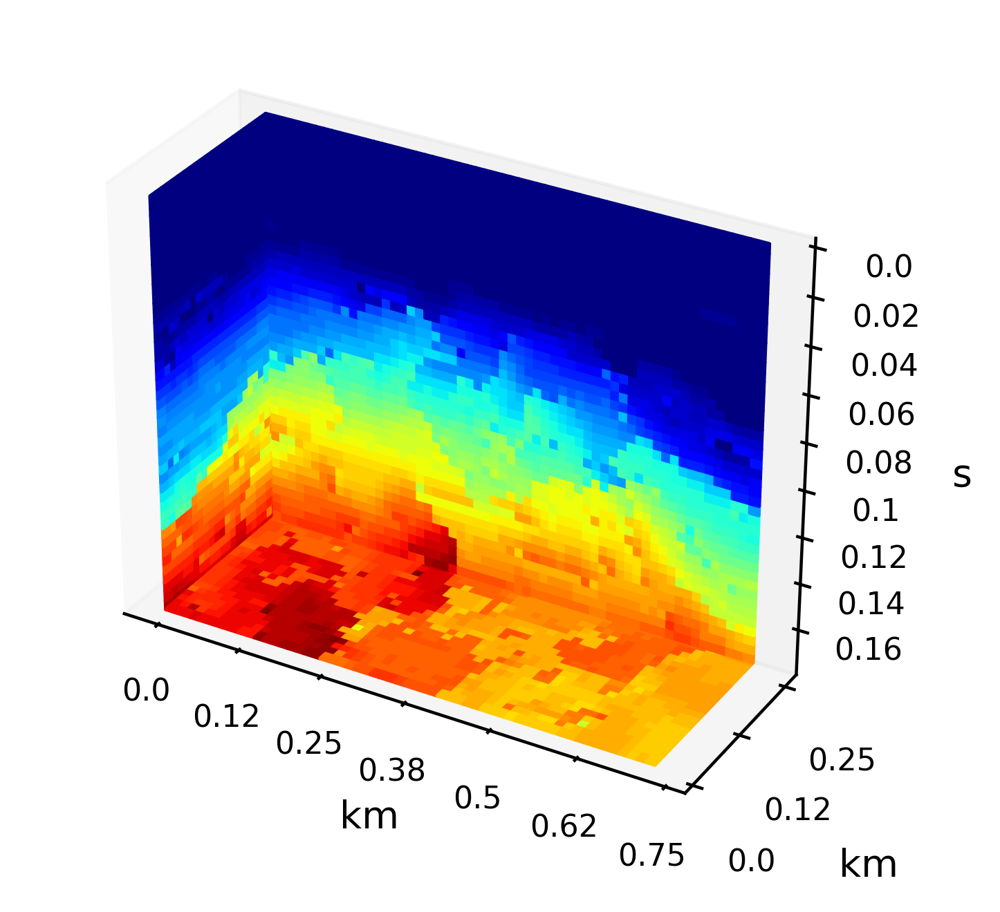

In [ ]:
#CREATING 3D SEISMIC SLICE FIGURE

fig = plt.figure(dpi=400)


fontsize = 8
dx = dy = 12.5; dt = 0.004

ax = fig.add_subplot(111, projection='3d')

ds_t=ds_x=ds_y = 1
seismic_data = dat_crop[::ds_t,::ds_x,::ds_y]


print(seismic_data.shape)
inline_index = seismic_data.shape[1] - 1
crossline_index = 0
timeslice_index = seismic_data.shape[0] - 1
# Plot inline slice

inline_slice = seismic_data[:, inline_index, :]
x = np.linspace(0, inline_slice.shape[1]-1, inline_slice.shape[1])
y = np.linspace(0, inline_slice.shape[0]-1, inline_slice.shape[0])
X, Y = np.meshgrid(x, y)
Z = np.full_like(X, inline_index)
ax.plot_surface(X, Z, Y, rstride=1, cstride=1, facecolors=plt.cm.gray(inline_slice / inline_slice.max()), shade=False)


# Plot crossline slice
crossline_slice = seismic_data[:,:, crossline_index]
x = np.linspace(0, crossline_slice.shape[1]-1, crossline_slice.shape[1])
y = np.linspace(0, crossline_slice.shape[0]-1, crossline_slice.shape[0])
X, Y = np.meshgrid(x, y)
Z = np.full_like(X, crossline_index)
ax.plot_surface(Z, X, Y, rstride=1, cstride=1, facecolors=plt.cm.gray(crossline_slice / crossline_slice.max()), shade=False)


# Plot time slice

time_slice = seismic_data[timeslice_index,:, :]
x = np.linspace(0, time_slice.shape[1]-1, time_slice.shape[1])
y = np.linspace(0, time_slice.shape[0]-1, time_slice.shape[0])
X, Y = np.meshgrid(x, y)
Z = np.full_like(X, timeslice_index)
print(Z.shape)
ax.plot_surface(X,Y,Z, rstride=1, cstride=1, facecolors=plt.cm.gray(time_slice / time_slice.max()), shade=False)

ax.set_box_aspect(aspect=(seismic_data.shape[2]/seismic_data.shape[0], seismic_data.shape[1]/seismic_data.shape[0], 1))




#scale ticks to correct units and add axis labels


zticks = ax.get_zticks()[:-1]
zticklabels = np.round(zticks *ds_t * dt, 2)
ax.set_zticks(zticks)
ax.set_zticklabels(zticklabels,fontsize=fontsize)
ax.set_zlabel('s', fontsize= fontsize + 2)


xticks = ax.get_xticks()[1:-1]
xticklabels = np.round(xticks * ds_x * dx / 1000, 2)
ax.set_xticks(xticks)
ax.set_xticklabels(xticklabels,fontsize=fontsize)
ax.set_xlabel('km', fontsize= fontsize + 2)



yticks = ax.get_yticks()[1:-1:2]
yticklabels = np.round(yticks * ds_y * dy / 1000, 2)
ax.set_yticks(yticks)
ax.set_yticklabels(yticklabels,fontsize=fontsize)
ax.set_ylabel('km', fontsize= fontsize + 2)





# Hide grid lines
ax.grid(False)
ax.invert_zaxis()

plt.savefig('./paperfigures/study_area.png')


(45, 22, 59)
(22, 59)


(-2.9000000000000004, 60.9, -1.05, 22.05)

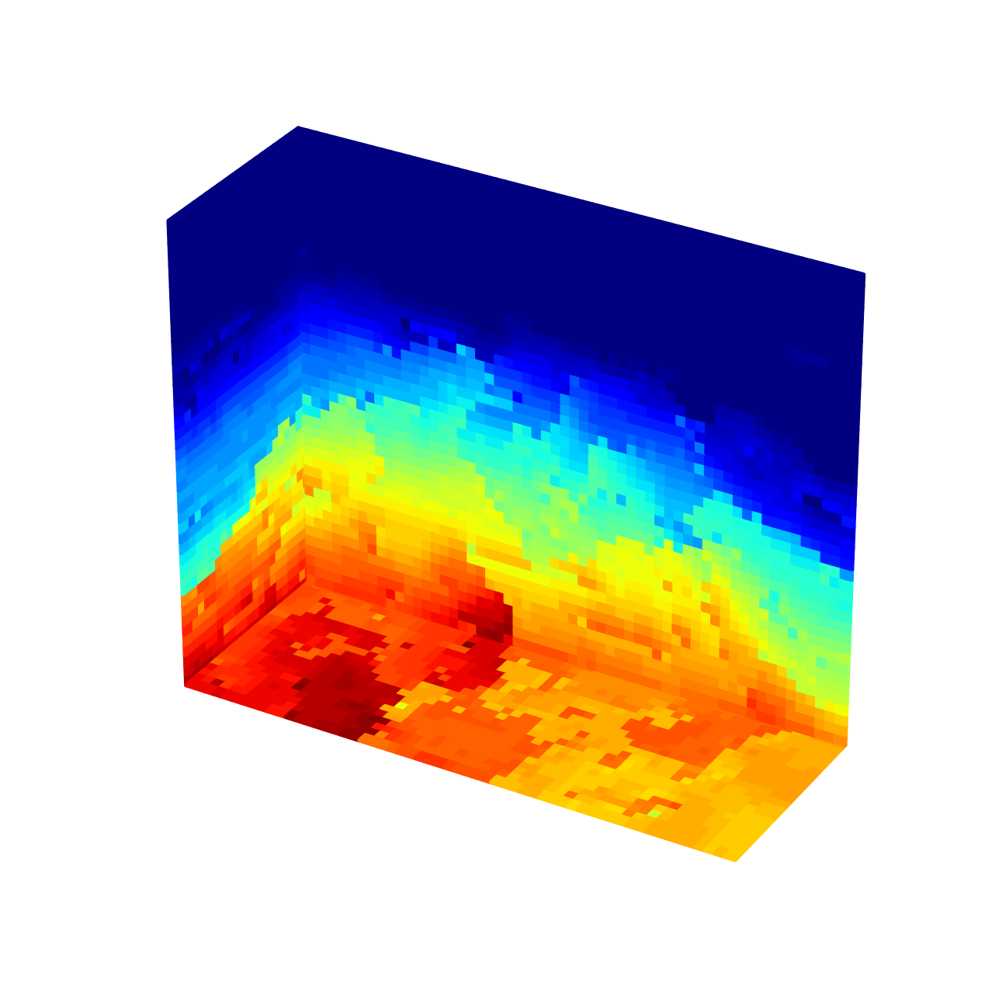

In [ ]:
#CREATING 3D SEISMIC SLICE FIGURE

fig = plt.figure(dpi=400)


fontsize = 8
dx = dy = 12.5; dt = 0.004

ax = fig.add_subplot(111, projection='3d')

ds_t=ds_x=ds_y = 1
seismic_data = phase_cube[::ds_t,::ds_x,::ds_y]


print(seismic_data.shape)
inline_index = seismic_data.shape[1] - 1
crossline_index = 0
timeslice_index = seismic_data.shape[0] - 1
# Plot inline slice

inline_slice = seismic_data[:, inline_index, :]
x = np.linspace(0, inline_slice.shape[1]-1, inline_slice.shape[1])
y = np.linspace(0, inline_slice.shape[0]-1, inline_slice.shape[0])
X, Y = np.meshgrid(x, y)
Z = np.full_like(X, inline_index)
ax.plot_surface(X, Z, Y, rstride=1, cstride=1, facecolors=plt.cm.jet(inline_slice / inline_slice.max()), shade=False)


# Plot crossline slice
crossline_slice = seismic_data[:,:, crossline_index]
x = np.linspace(0, crossline_slice.shape[1]-1, crossline_slice.shape[1])
y = np.linspace(0, crossline_slice.shape[0]-1, crossline_slice.shape[0])
X, Y = np.meshgrid(x, y)
Z = np.full_like(X, crossline_index)
ax.plot_surface(Z, X, Y, rstride=1, cstride=1, facecolors=plt.cm.jet(crossline_slice / crossline_slice.max()), shade=False)


# Plot time slice

time_slice = seismic_data[timeslice_index,:, :]
x = np.linspace(0, time_slice.shape[1]-1, time_slice.shape[1])
y = np.linspace(0, time_slice.shape[0]-1, time_slice.shape[0])
X, Y = np.meshgrid(x, y)
Z = np.full_like(X, timeslice_index)
print(Z.shape)
ax.plot_surface(X,Y,Z, rstride=1, cstride=1, facecolors=plt.cm.jet(time_slice / time_slice.max()), shade=False)

ax.set_box_aspect(aspect=(seismic_data.shape[2]/seismic_data.shape[0], seismic_data.shape[1]/seismic_data.shape[0], 1))




#scale ticks to correct units and add axis labels


zticks = ax.get_zticks()[:-1]
zticklabels = np.round(zticks *ds_t * dt, 2)
ax.set_zticks(zticks)
ax.set_zticklabels(zticklabels,fontsize=fontsize)
ax.set_zlabel('s', fontsize= fontsize + 2)


xticks = ax.get_xticks()[1:-1]
xticklabels = np.round(xticks * ds_x * dx / 1000, 2)
ax.set_xticks(xticks)
ax.set_xticklabels(xticklabels,fontsize=fontsize)
ax.set_xlabel('km', fontsize= fontsize + 2)



yticks = ax.get_yticks()[1:-1:2]
yticklabels = np.round(yticks * ds_y * dy / 1000, 2)
ax.set_yticks(yticks)
ax.set_yticklabels(yticklabels,fontsize=fontsize)
ax.set_ylabel('km', fontsize= fontsize + 2)





# Hide grid lines
ax.grid(False)
ax.invert_zaxis()
ax.axis('off')
#plt.savefig('./paperfigures/study_area.png')
